# Problem - 1

The comp-activ database comprises activity measures of computer systems. Data was gathered from a Sun Sparcstation 20/712 with 128 Mbytes of memory, operating in a multi-user university department. Users engaged in diverse tasks, such as internet access, file editing, and CPU-intensive programs.

Being an aspiring data scientist, you aim to establish a linear equation for predicting 'usr' (the percentage of time CPUs operate in user mode). Your goal is to analyze various system attributes to understand their influence on the system's 'usr' mode.

## Data Description :

System measures used:

*lread - Reads (transfers per second ) between system memory and user memory
*lwrite - writes (transfers per second) between system memory and user memory
*scall - Number of system calls of all types per second
*sread - Number of system read calls per second .
*swrite - Number of system write calls per second .
*fork - Number of system fork calls per second.
*exec - Number of system exec calls per second.
*rchar - Number of characters transferred per second by system read calls
*wchar - Number of characters transfreed per second by system write calls
*pgout - Number of page out requests per second
*ppgout - Number of pages, paged out per second
*pgfree - Number of pages per second placed on the free list.
*pgscan - Number of pages checked if they can be freed per second
*atch - Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second
*pgin - Number of page-in requests per second
*ppgin - Number of pages paged in per second
*pflt - Number of page faults caused by protection errors (copy-on-writes).
*vflt - Number of page faults caused by address translation .
*runqsz - Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.
*Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.)
*freemem - Number of memory pages available to user processes
*freeswap - Number of disk blocks available for page swapping.


*usr - Portion of time (%) that cpus run in user mode

# 1.1 Define the problem and perform exploratory Data Analysis

## 1.1.1 Import the libraries

In [1]:
#For Data Wrangling/Data Processing
import numpy as np   
import pandas as pd    

#For Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 
import matplotlib.style

#For Modeling
from sklearn.linear_model import LinearRegression

#For Validation
from sklearn import metrics

#Filtering warning message
import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
import math

# For randomized data splitting
from sklearn.model_selection import train_test_split

# To build linear regression_model
import statsmodels.api as sm

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

## 1.1.2 Reading and loading the dataset compactiv.xls

In [2]:
df=pd.read_excel('compactiv.xlsx')

In [3]:
df.head(5)

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


## 1.1.3 Checking shape of the dataset

In [4]:
df.shape
print("The dataset has ", df.shape[0], "rows and", df.shape[1], "columns.")

The dataset has  8192 rows and 22 columns.


## 1.1.4 Checking the datatypes

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

### Insights:

1. There are 21 numerical datatype column and 1 object datatype column.
2. The 'runqsz' column is a categorical column.
3. All columns have non-null values. The columns rchar and wchar have only 8088 and 8177 records, instead of 8192 records. This needs to be investigated further.

## 1.1.5 Checking the statistical summary

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [7]:
df.describe(include='object').T

,count,unique,top,freq
runqsz,8192,2,Not_CPU_Bound,4331


In [8]:
df.skew().sort_values(ascending=False).head(2)

atch     21.542020
lread    13.897852
dtype: float64

In [9]:
df.mean().sort_values(ascending=False).head(2)

freeswap    1.328126e+06
rchar       1.973857e+05
dtype: float64

In [10]:
df.median().sort_values(ascending=False).head(2)

freeswap    1289289.5
rchar        125473.5
dtype: float64

### Insights:

1. The skewness is maximum for atch variable followed by lread column.
2. Freeswap column has the maximum mean of 1328126 followed by rchar which has a mean of 197385.
3. The median value is maximum for freeswap column which is 1289289 followed by rchar.
4. The range of rchar is the maximum ranging from a minimum of 278 to a maximum of 2526649.
5. The variability is the most in freeswap column with standard deviation of 422019.
6. The rchar column has the maximum value in the dataset.

## 1.1.6 Univariate Analysis

Univariate analysis of all the fields is done using a histogram and a boxplot. 
First, we divide the dataset into a dataset with numerical fields and another dataset with categorical fields.

In [11]:
df_num = df.select_dtypes(include=['int64','float64'])
df_cat = df.select_dtypes(['object'])

In [1]:
[1,2,3]*3

[1, 2, 3, 1, 2, 3, 1, 2, 3]

## 1.1.6.1 Numeric Columns

In [12]:
lstnumericcolumns=list(df_num.columns.values)
len(lstnumericcolumns)

21

In [13]:
def univariateAnalysis_numeric (column, nbins) :
    print ("Description of " +  column)
    print("---------")
    print(df[column].describe().round(2), end=' ')
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (9, 4))
          
    ax = axs[0].hist(df[column], bins=nbins, histtype="bar", edgecolor='Black', color='green', lw=2)
    axs[0].set_title("Distribution of " + column, y= -0.2)
          
    for container in axs[0].containers:
        axs[0].bar_label (container, label_type="edge", fontsize=7)

    sns.boxplot (y=df[column], orient= 'v', ax=axs[1]) 
    axs[1].set_title("Boxplot of " + column, y = -0.2)
    
    plt.tight_layout() #neat output
    plt.show()


Description of lread
---------
count    8192.00
mean       19.56
std        53.35
min         0.00
25%         2.00
50%         7.00
75%        20.00
max      1845.00
Name: lread, dtype: float64 

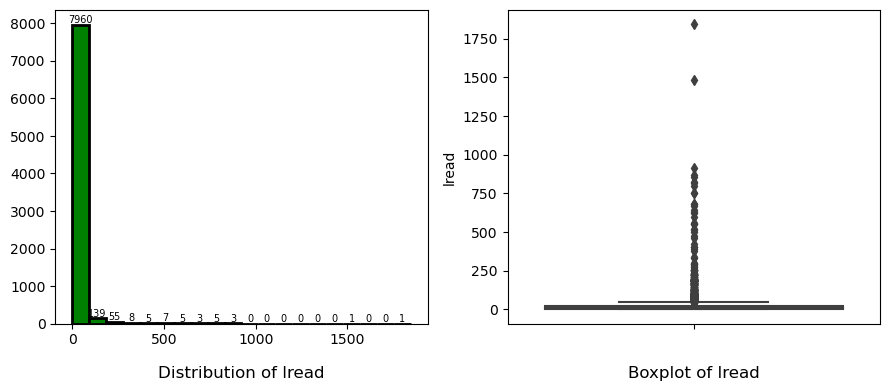

Description of lwrite
---------
count    8192.00
mean       13.11
std        29.89
min         0.00
25%         0.00
50%         1.00
75%        10.00
max       575.00
Name: lwrite, dtype: float64 

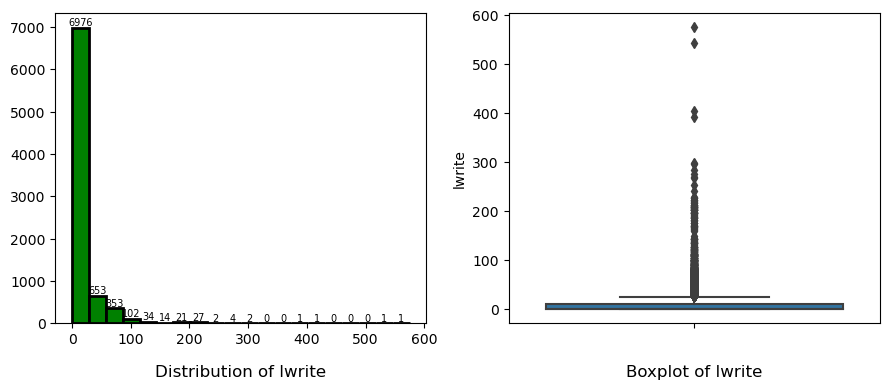

Description of scall
---------
count     8192.00
mean      2306.32
std       1633.62
min        109.00
25%       1012.00
50%       2051.50
75%       3317.25
max      12493.00
Name: scall, dtype: float64 

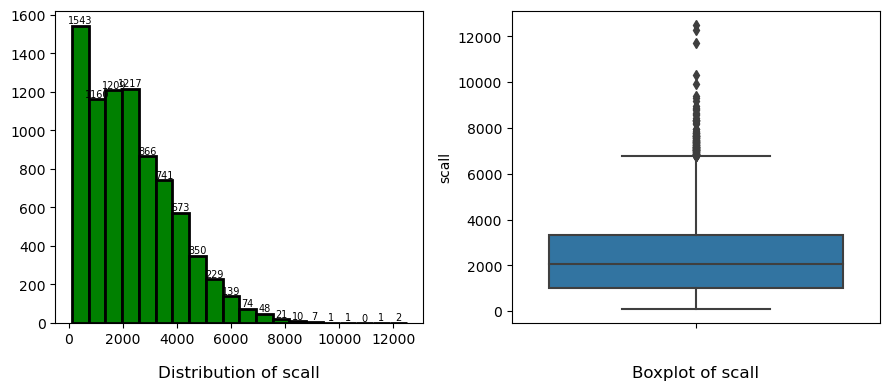

Description of sread
---------
count    8192.00
mean      210.48
std       198.98
min         6.00
25%        86.00
50%       166.00
75%       279.00
max      5318.00
Name: sread, dtype: float64 

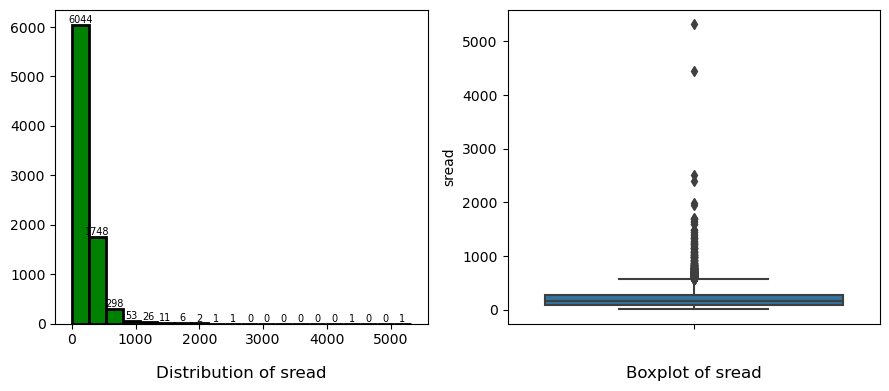

Description of swrite
---------
count    8192.00
mean      150.06
std       160.48
min         7.00
25%        63.00
50%       117.00
75%       185.00
max      5456.00
Name: swrite, dtype: float64 

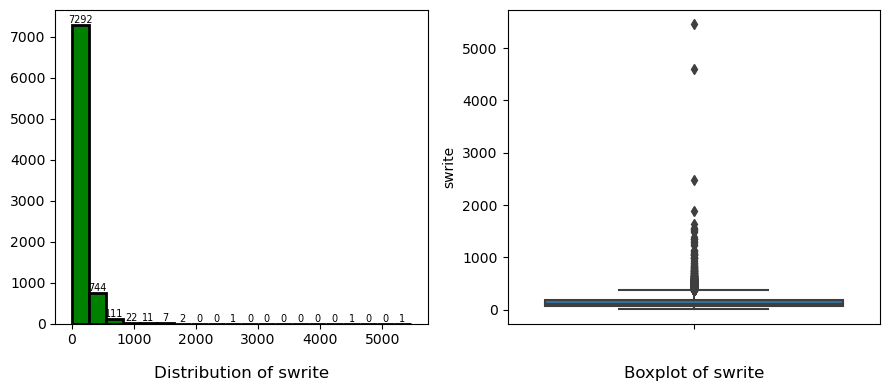

Description of fork
---------
count    8192.00
mean        1.88
std         2.48
min         0.00
25%         0.40
50%         0.80
75%         2.20
max        20.12
Name: fork, dtype: float64 

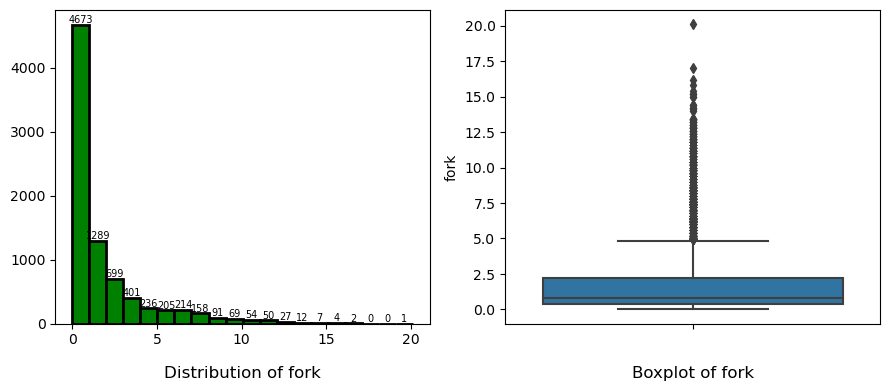

Description of exec
---------
count    8192.00
mean        2.79
std         5.21
min         0.00
25%         0.20
50%         1.20
75%         2.80
max        59.56
Name: exec, dtype: float64 

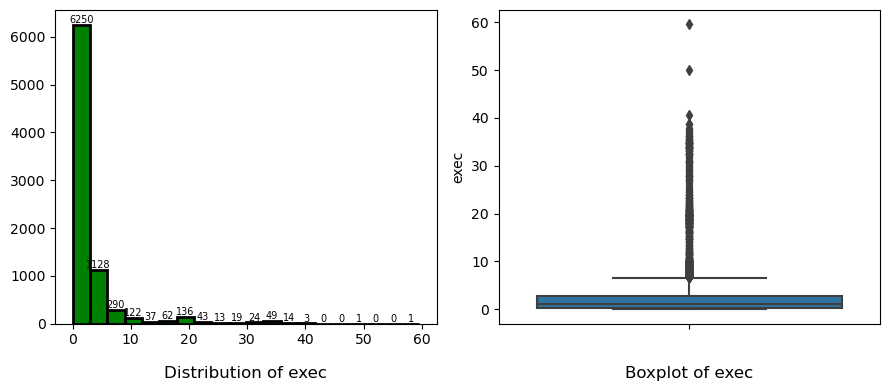

Description of rchar
---------
count       8088.00
mean      197385.73
std       239837.49
min          278.00
25%        34091.50
50%       125473.50
75%       267828.75
max      2526649.00
Name: rchar, dtype: float64 

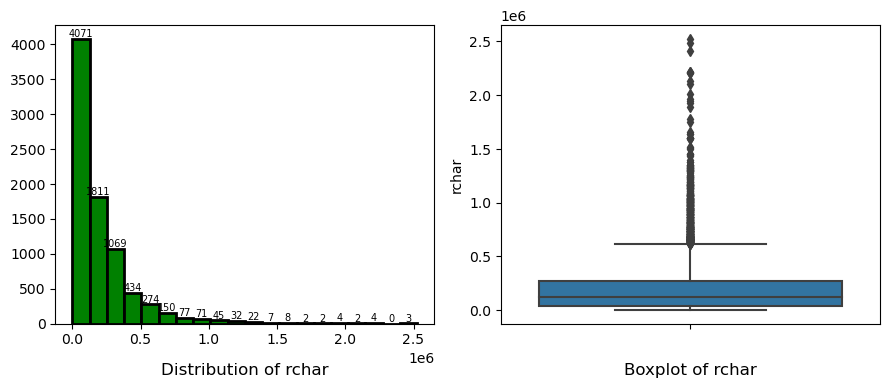

Description of wchar
---------
count       8177.00
mean       95902.99
std       140841.71
min         1498.00
25%        22916.00
50%        46619.00
75%       106101.00
max      1801623.00
Name: wchar, dtype: float64 

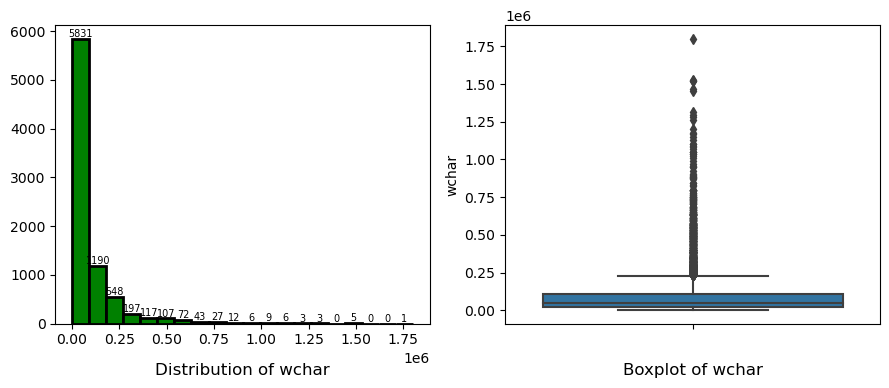

Description of pgout
---------
count    8192.00
mean        2.29
std         5.31
min         0.00
25%         0.00
50%         0.00
75%         2.40
max        81.44
Name: pgout, dtype: float64 

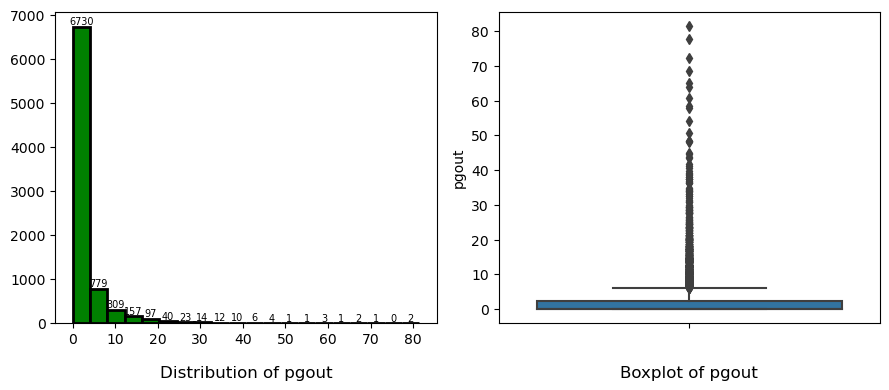

Description of ppgout
---------
count    8192.00
mean        5.98
std        15.21
min         0.00
25%         0.00
50%         0.00
75%         4.20
max       184.20
Name: ppgout, dtype: float64 

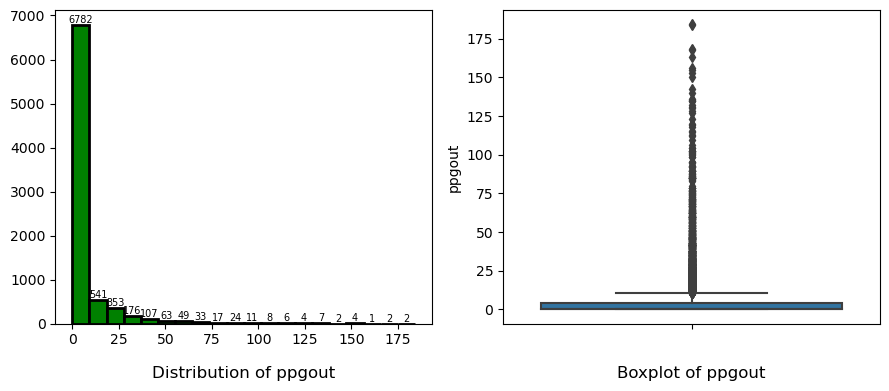

Description of pgfree
---------
count    8192.00
mean       11.92
std        32.36
min         0.00
25%         0.00
50%         0.00
75%         5.00
max       523.00
Name: pgfree, dtype: float64 

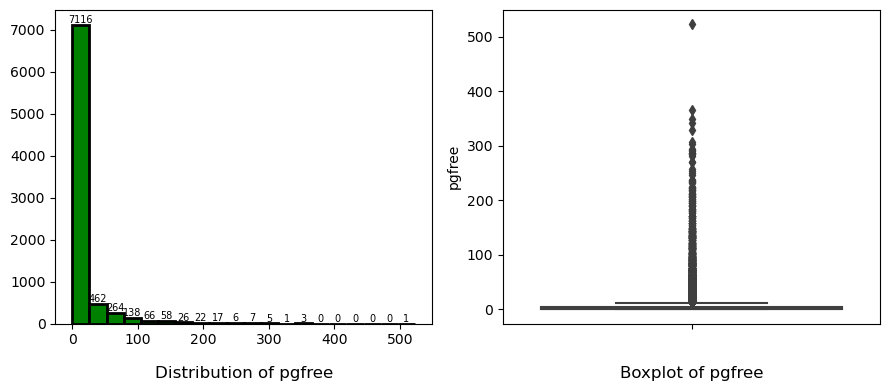

Description of pgscan
---------
count    8192.00
mean       21.53
std        71.14
min         0.00
25%         0.00
50%         0.00
75%         0.00
max      1237.00
Name: pgscan, dtype: float64 

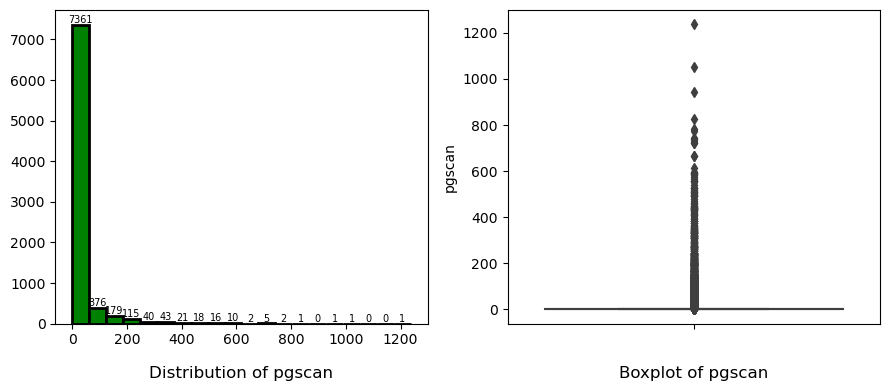

Description of atch
---------
count    8192.00
mean        1.13
std         5.71
min         0.00
25%         0.00
50%         0.00
75%         0.60
max       211.58
Name: atch, dtype: float64 

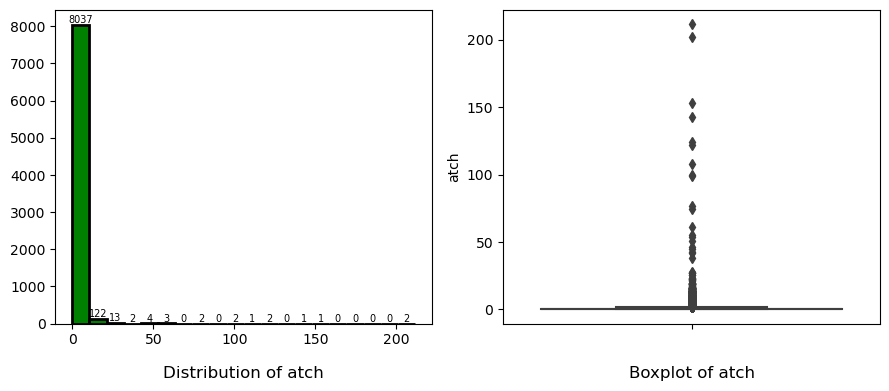

Description of pgin
---------
count    8192.00
mean        8.28
std        13.87
min         0.00
25%         0.60
50%         2.80
75%         9.76
max       141.20
Name: pgin, dtype: float64 

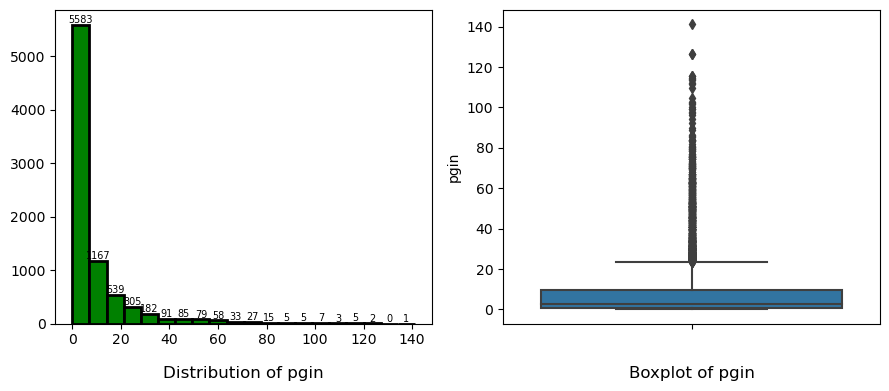

Description of ppgin
---------
count    8192.00
mean       12.39
std        22.28
min         0.00
25%         0.60
50%         3.80
75%        13.80
max       292.61
Name: ppgin, dtype: float64 

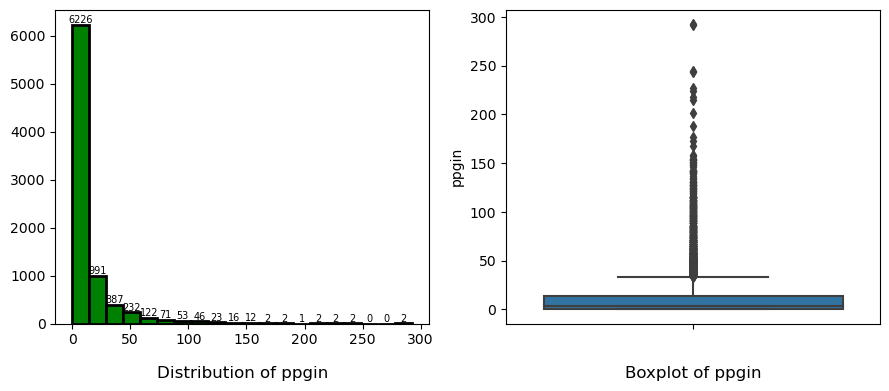

Description of pflt
---------
count    8192.00
mean      109.79
std       114.42
min         0.00
25%        25.00
50%        63.80
75%       159.60
max       899.80
Name: pflt, dtype: float64 

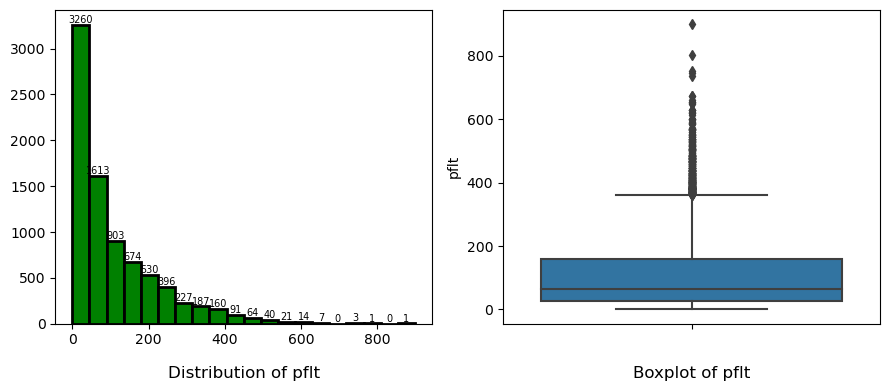

Description of vflt
---------
count    8192.00
mean      185.32
std       191.00
min         0.20
25%        45.40
50%       120.40
75%       251.80
max      1365.00
Name: vflt, dtype: float64 

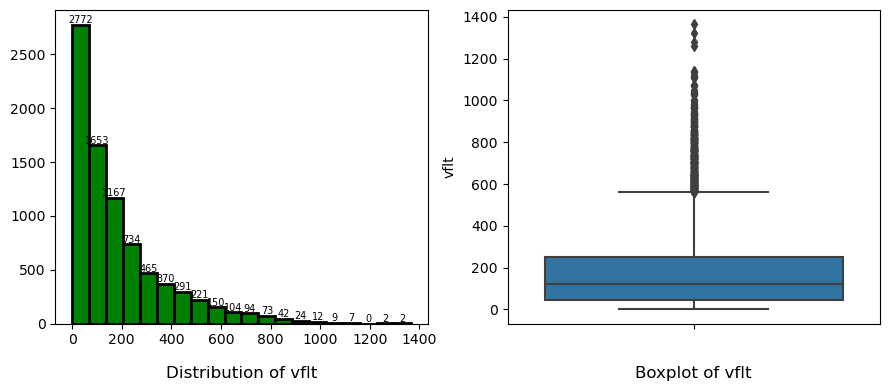

Description of freemem
---------
count     8192.00
mean      1763.46
std       2482.10
min         55.00
25%        231.00
50%        579.00
75%       2002.25
max      12027.00
Name: freemem, dtype: float64 

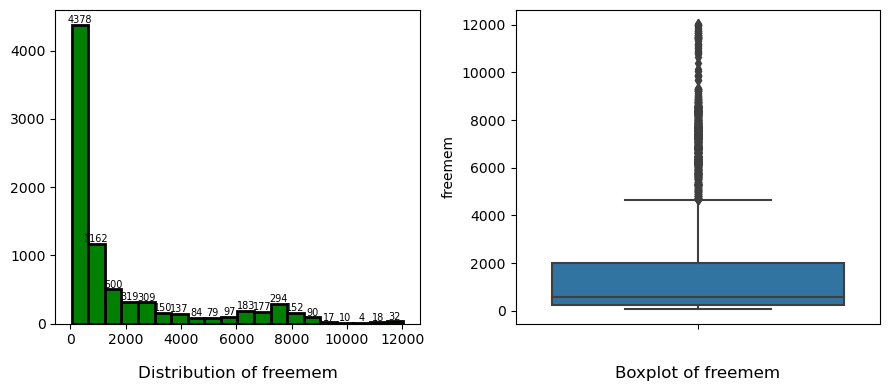

Description of freeswap
---------
count       8192.00
mean     1328125.96
std       422019.43
min            2.00
25%      1042623.50
50%      1289289.50
75%      1730379.50
max      2243187.00
Name: freeswap, dtype: float64 

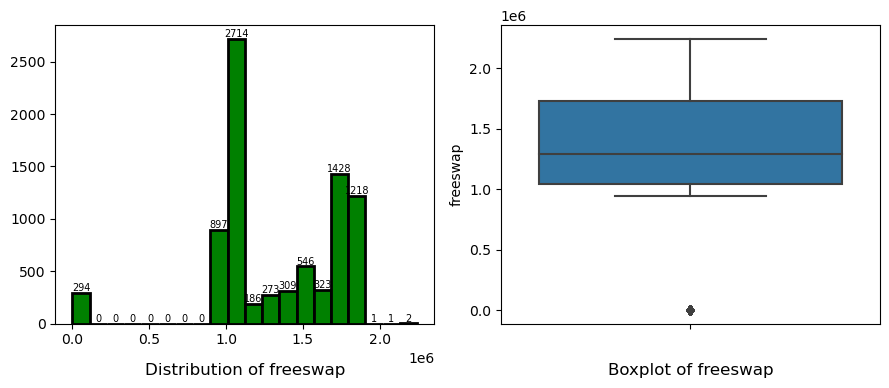

Description of usr
---------
count    8192.00
mean       83.97
std        18.40
min         0.00
25%        81.00
50%        89.00
75%        94.00
max        99.00
Name: usr, dtype: float64 

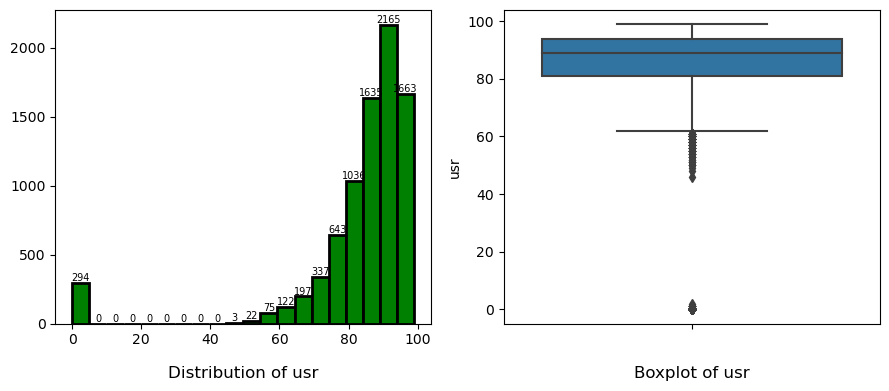

In [14]:
for i in lstnumericcolumns:
    univariateAnalysis_numeric(i, 20)

## 1.1.6.2 Categorical Columns

Text(0.5, -0.2, 'Fig 1.2: Univariate Analysis of Object type column - runqsz')

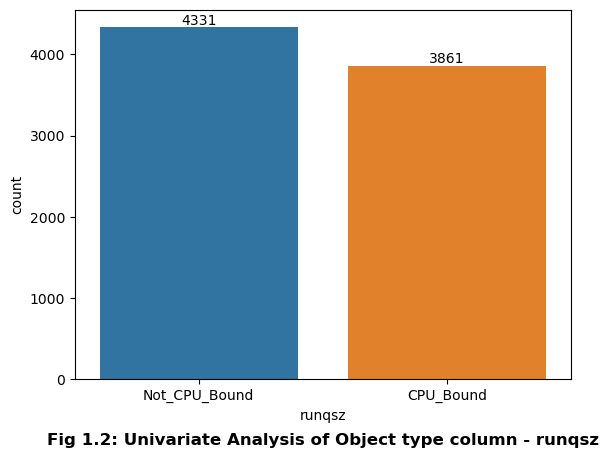

In [15]:
splot=sns.countplot(df, x=df['runqsz'],order=df['runqsz'].value_counts().index);
plt.bar_label(splot.containers[0])
plt.title("Fig 1.2: Univariate Analysis of Object type column - runqsz", y=-0.2, fontweight = 'bold')

### Insights:

1. There are 21 numerical fields in the dataset. 
2. All numerical columns are right-skewed, except freeswap and usr fields. The right-skewed fields have the mean values greater than the medians.
3. The freeswap and usr columns are left-skewed.
4. All fields have outliers. 
5. The median of the usr field is at 89 while the mean is 83.
6. The free memory, Freemem field has a median of 579 with mean of 1763.
7. The outliers need to be treated.
8. We observe that the count of Not_CPU_Bound process run queue size is more than that of CPU_Bound queue size. Not_CPU_Bound is 4331 and CPU_Bound is 3861. 

## 1.1.7 Multivariate Analysis

A bivariate analysis among the different variables can be done using scatter matrix plot. Seaborn libs create a dashboard reflecting useful information about the dimensions. The result can be stored as a .png file.

### 1.1.7.1 Numeric vs Numeric

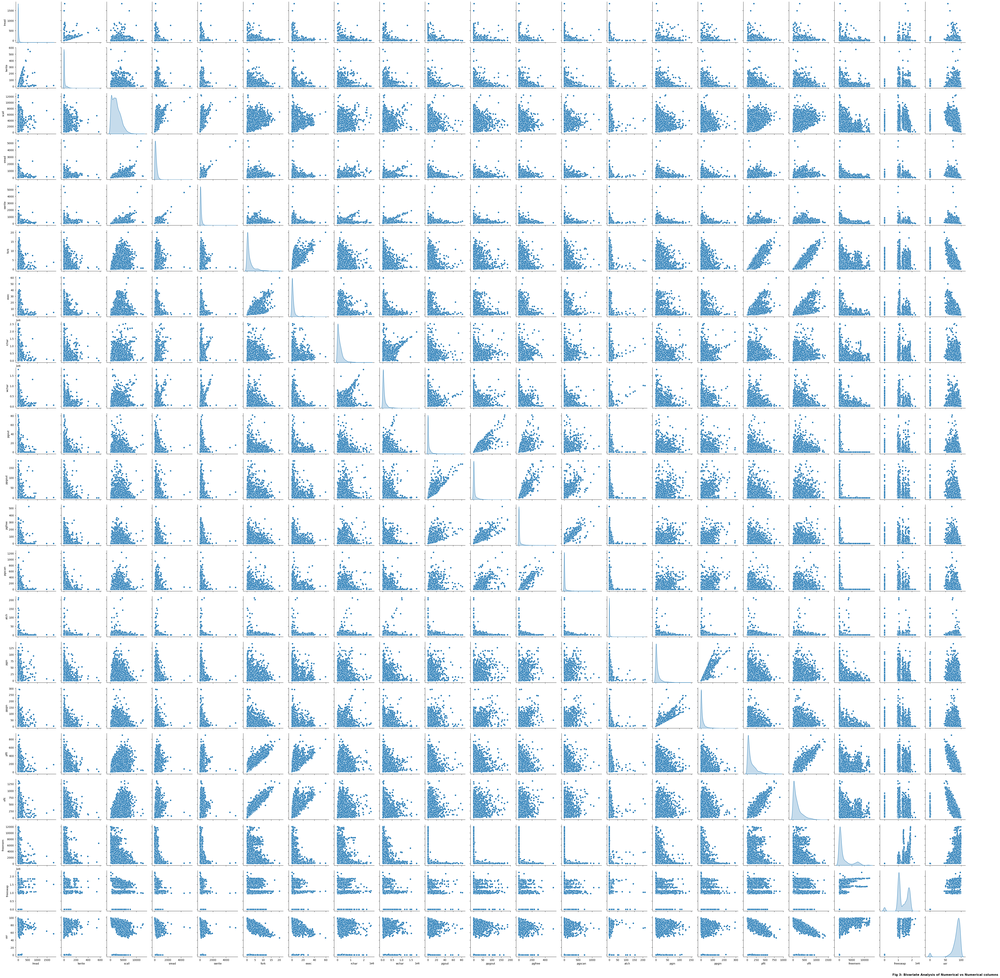

In [16]:
sns.pairplot(df_num, diag_kind="kde")  # to plot density curve instead of histogram on the diag)
plt.title("Fig 3: Bivariate Analysis of Numerical vs Numerical columns", y=-0.5, fontweight='bold')
plt.show()

### 1.1.7.2 Categorical vs Numeric

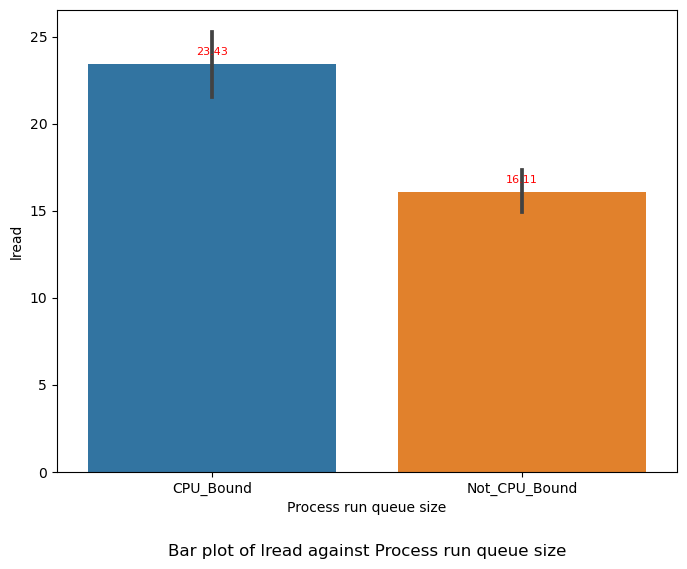

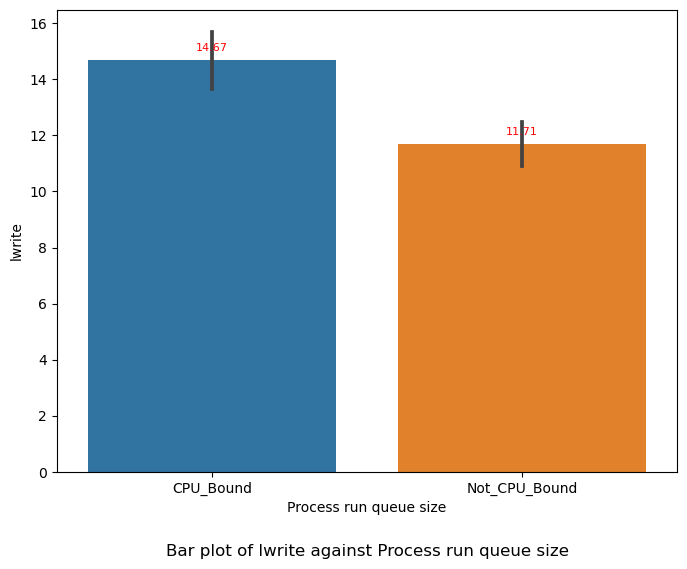

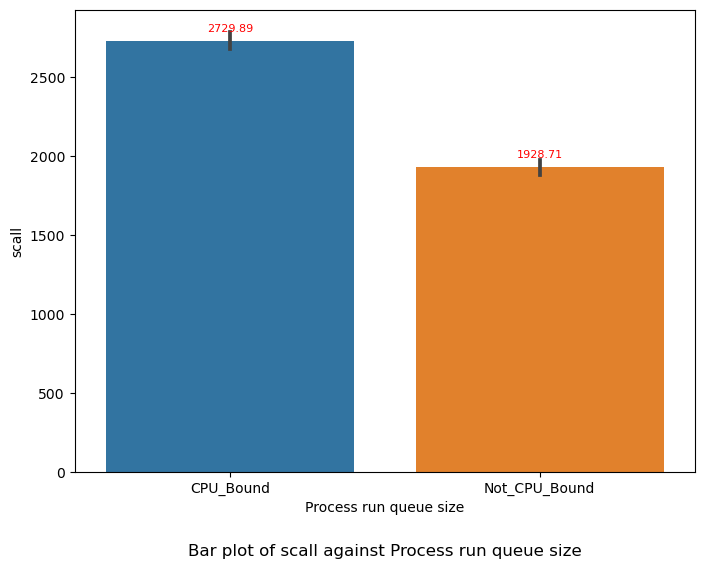

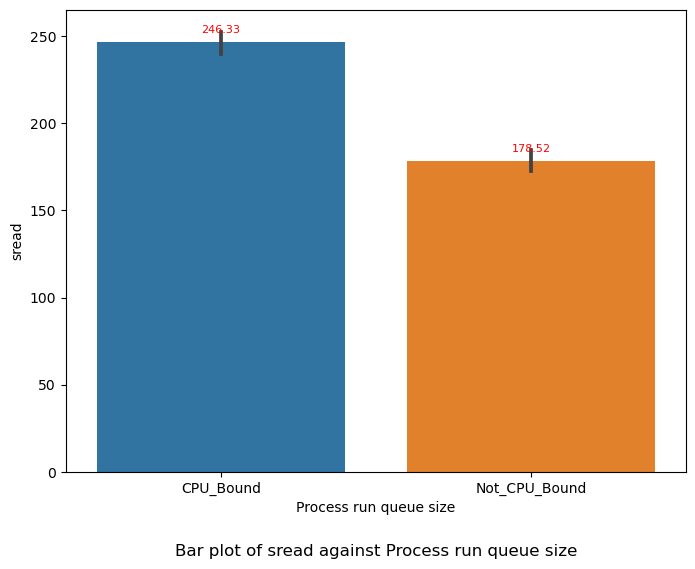

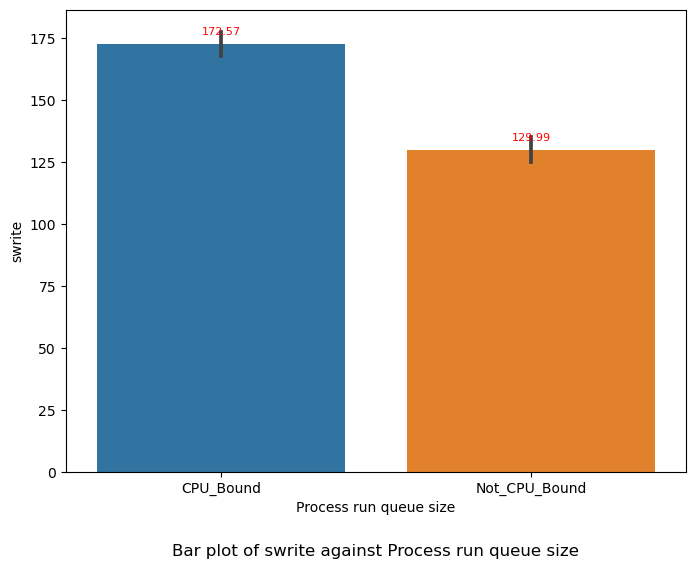

...

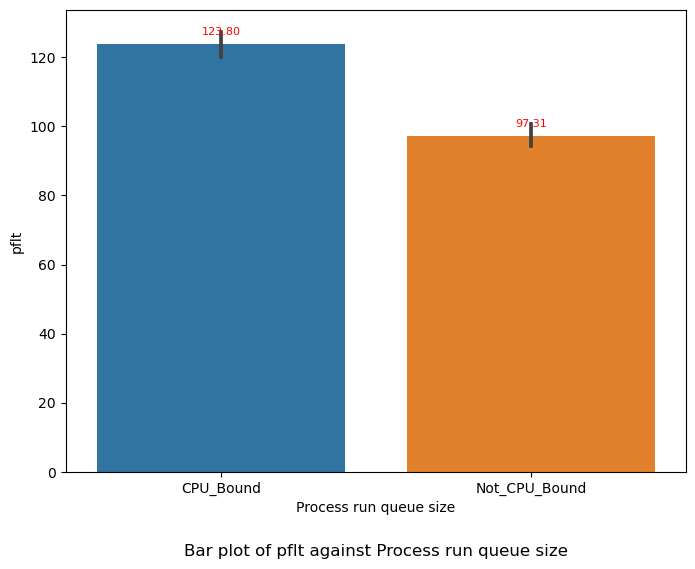

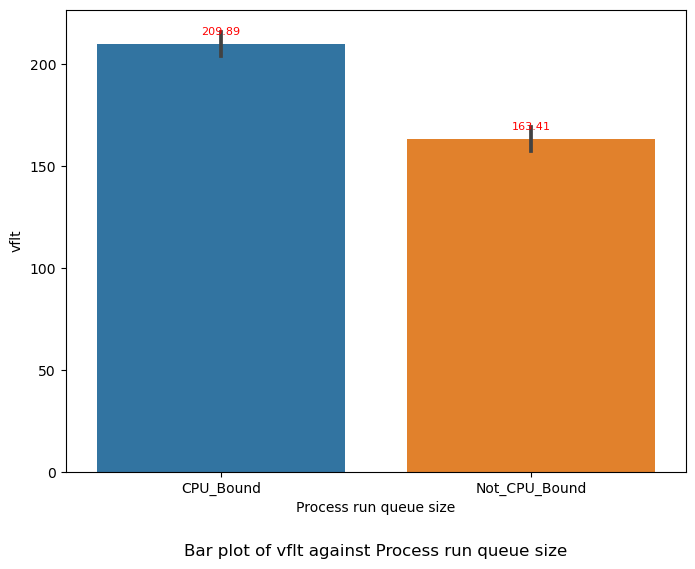

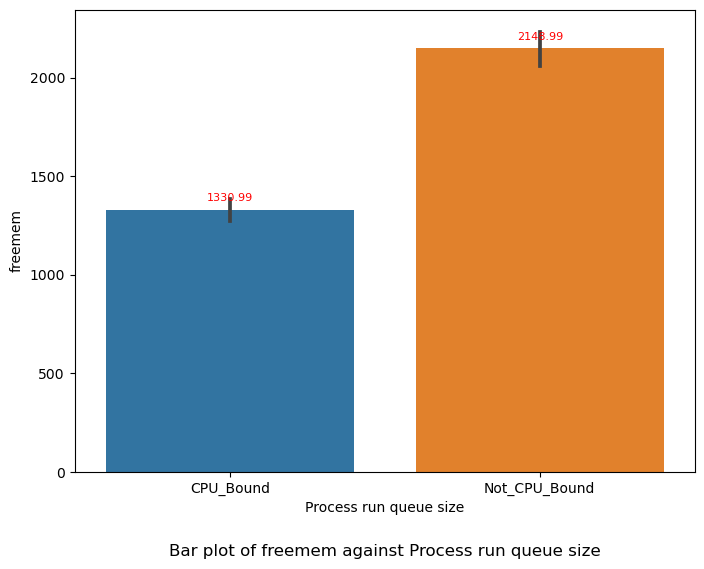

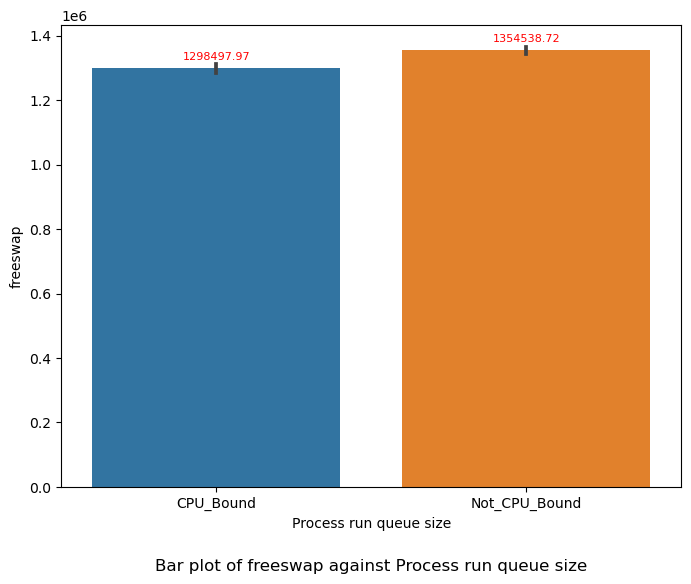

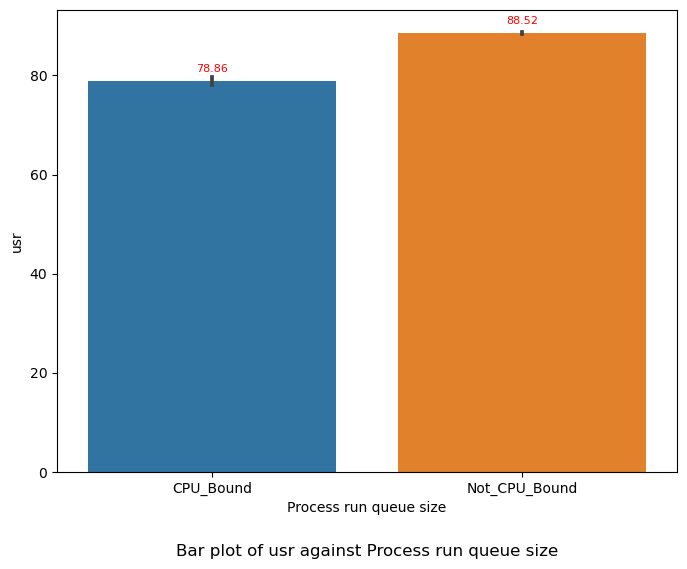

In [17]:
for i in df_num:
    plt.figure(figsize=(8, 6))
    ax=sns.barplot(x='runqsz', y=i, data=df, linewidth=0, edgecolor='None')
    
    plt.title(f'Bar plot of {i} against Process run queue size', y= -0.2)
    plt.xlabel('Process run queue size')
    plt.ylabel(i)
    
    
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', 
                    va='bottom',
                    xytext=(0, 5), 
                    textcoords='offset points',
                    fontsize=8,
                    color='red')
    
    
    plt.show()

### 1.1.7.3 Correlation Plot

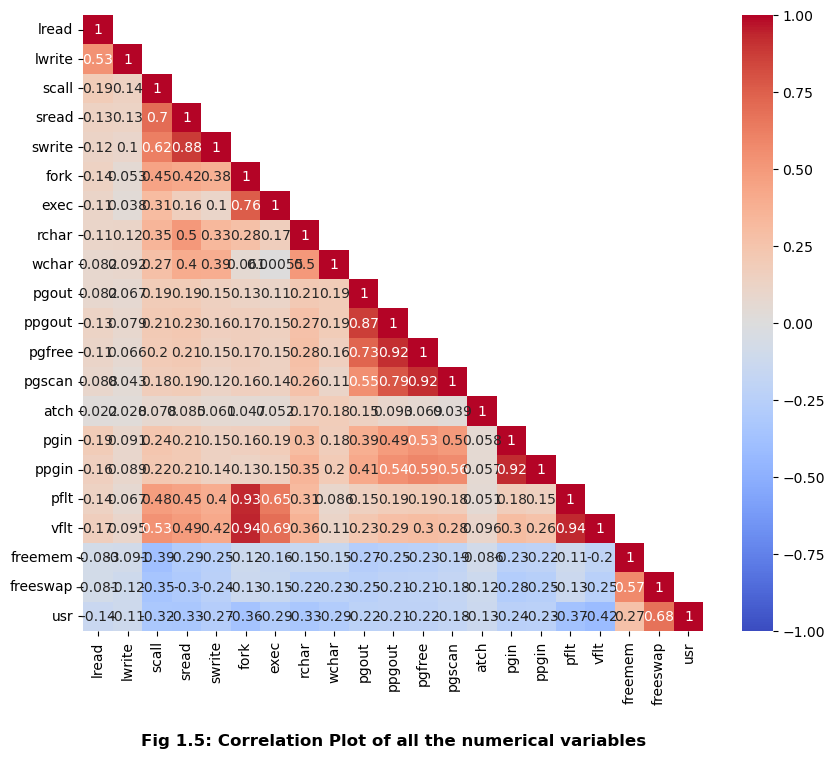

In [18]:
## Checking on the correlation between the variables
Cor=df.corr(method='pearson')
plt.figure(figsize=(10,8))
mask = np.array (Cor)
mask[np.tril_indices_from(mask)] =False
sns.heatmap(data =Cor, annot =True, mask =mask, vmax =1, vmin=-1, cmap ='coolwarm');
plt.title("Fig 1.5: Correlation Plot of all the numerical variables", y=-0.2, fontweight='bold')
plt.show()

### 1.1.7.4 Key meaningful observations on individual variables and the relationship between variables

The process run queue size vs lread, lwrite, system call scall, system read sread, system write swrite, fork, exec, rchar, wchar, pgout, ppgout, pgfree, atch, pgin, ppgin, pflt, vflt is more for CPU_Bound as compared to Not_CPU_Bound.

The process run queue size vs free memory freemem, freeswp and usr is more for Not_CPU_Bound as compared to CPU_Bound.

The correlation is maximum between:
* fork and vflt
* fork and pflt
* pflt and vflt
* pgin and ppgin
* pgfree and pgscan
* ppgout and pgfree

We can see some correlation between the various fields.

## 1.2 Data Preprocessing

### 1.2.1 Missing values treatment

In [19]:
# Are there any missing values?

df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

### Insights:

The columns 'rchar' and 'wchar' have missing values.
Both are integer type columns, hence we can impute the median value into these missing rows.

In [20]:
df.rchar.fillna(df.rchar.median(),inplace=True)

In [21]:
df.wchar.fillna(df.wchar.median(),inplace=True)

In [22]:
df.isnull().sum()  

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

Now, we see that all the missing values have been treated and the dataset is ready to be modeled.  

### Check for duplicates

In [23]:
#Check for presence of duplicate rows
dup = df.duplicated()
print("No. of duplicate rows is", dup.sum())



No. of duplicate rows is 0


### Insights:

There were 104 missing values in rchar column and 15 missing values in wchar.
All the missing values were treated by imputing them with the median values.
Duplicates were also checked and no duplicate rows were found in the dataset.

## 1.2.2 Outliers Detection

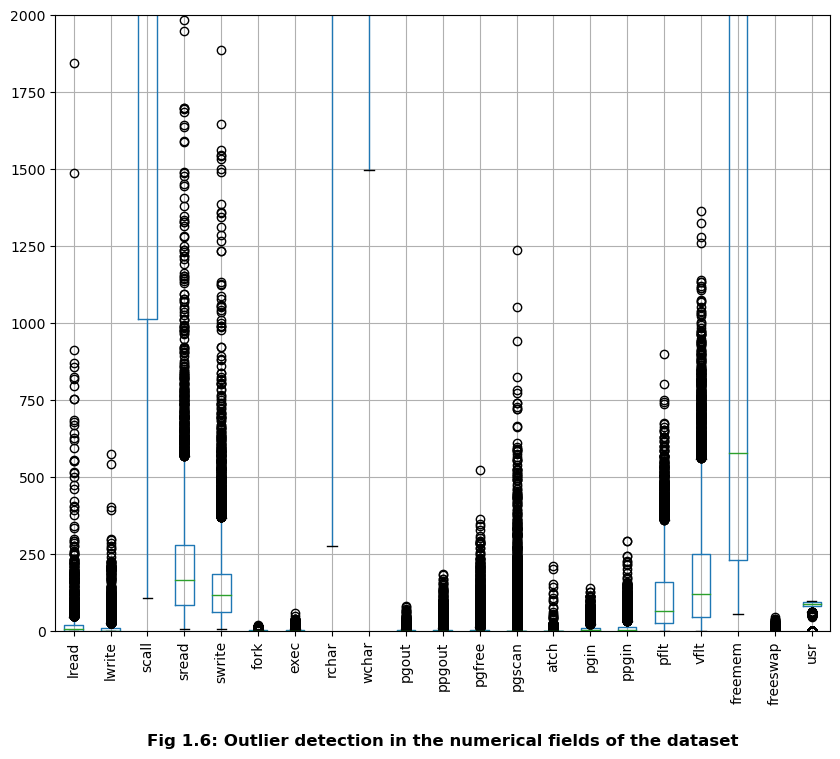

In [24]:
df_num.boxplot(figsize=(10,8))
plt.ylim(0, 2000)
plt.xticks(rotation=90)
plt.title("Fig 1.6: Outlier detection in the numerical fields of the dataset", y = -0.2, fontweight='bold')
plt.show()

In [25]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [26]:
for column in df_num.columns:
    lr,ur=remove_outlier(df_num[column])
    df_num[column]=np.where(df_num[column]>ur,ur,df_num[column])
    df_num[column]=np.where(df_num[column]<lr,lr,df_num[column])

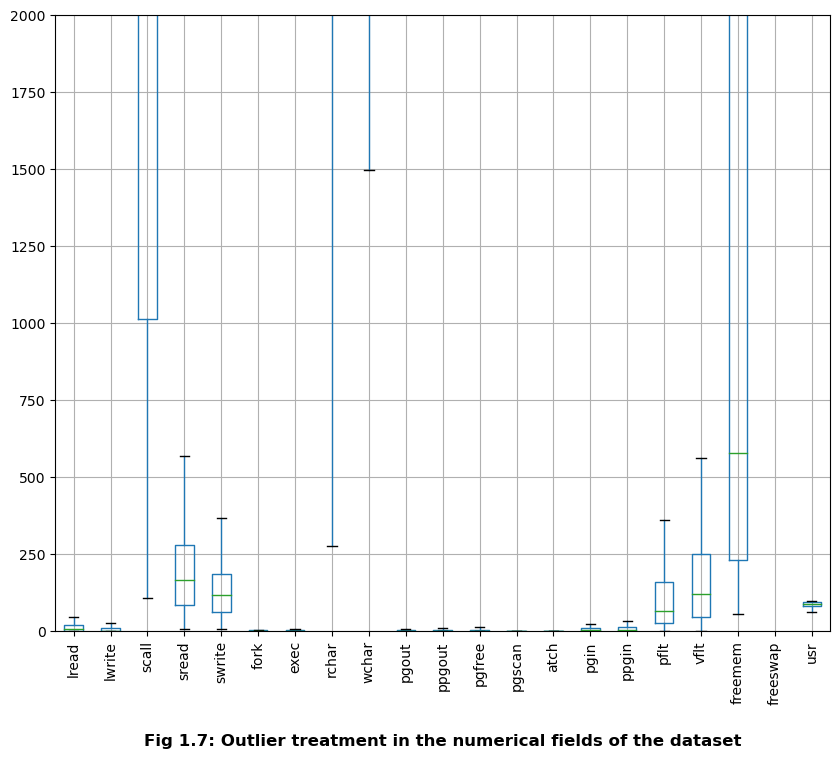

In [27]:
df_num.boxplot(figsize=(10,8))
plt.ylim(0, 2000)
plt.xticks(rotation=90)
plt.title("Fig 1.7: Outlier treatment in the numerical fields of the dataset", y = -0.2, fontweight='bold')
plt.show()

We see that there were outliers in every column in the boxplot. After treating the outliers, we see that the columns have no outliers.

## 1.2.3 Feature Engineering

Feature engineering is a crucial step in the machine learning pipeline. It involves creating new features or modifying existing features which might enable the machine learning models to predict more accurately.

We can create new features that capture the interaction between different system attributes. For example, a feature can be created that represents the ratio of 'lread' to 'lwrite' or 'pgin' to 'pgout'. These new features might help in capturing the relationships between different system attributes more effectively. 

For this dataset, no new feature has been created.


## 1.2.4 Encode the data

In [28]:
#get dummies will convert the categorical columns into binary output
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)


In [29]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


We see that a column runqsz_Not_CPU_Bound column has been formed.
The column runqsz_CPU_Bound has been dropped so that there is no linear dependancy between the 2 columns.

## 1.2.5 Train-Test split

### 1.2.5.1 Separate X and Y

In [30]:
X=df.drop('usr',axis=1)
Y=df.pop('usr')

In [31]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,1
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,1


In [32]:
Y.head()

0    95
1    97
2    87
3    98
4    90
Name: usr, dtype: int64

### 1.2.5.2 Train and Test split

In [33]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30 , random_state=1)

In [34]:
X_train

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
694,1,1,1345,223,192,0.6,0.6,198703.0,293578.0,0.60,...,23.40,56.40,2.60,3.80,7.40,28.20,56.60,121,1375446,0
5535,1,1,1429,87,67,0.2,0.2,7163.0,24842.0,0.00,...,0.00,0.00,0.00,1.60,1.60,15.77,30.74,1476,1021541,1
4244,49,71,3273,225,180,0.6,0.4,83246.0,53705.0,5.39,...,7.19,0.00,2.79,3.99,4.59,59.88,74.05,82,18,0
2472,13,8,4349,300,191,2.8,3.0,96009.0,70467.0,0.00,...,0.00,0.00,0.00,2.80,3.20,129.00,236.80,772,993909,0
7052,17,23,225,13,13,0.4,1.6,17132.0,12514.0,0.00,...,0.00,0.00,0.00,0.00,0.00,19.80,23.80,4179,1821682,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7935,1,0,3159,461,232,1.8,1.4,318346.0,64616.0,5.59,...,56.89,165.27,0.40,35.13,56.69,78.24,167.86,145,1125303,0
5192,3,0,493,72,55,0.6,0.8,29548.0,12598.0,4.00,...,4.60,0.00,0.40,6.60,7.00,39.60,59.00,325,1701342,0
3980,5,1,2410,176,150,0.6,0.6,74357.0,96317.0,7.00,...,53.60,87.60,0.20,3.40,5.40,70.00,140.40,170,1065320,0
235,2,0,2140,170,142,1.4,1.4,280183.0,189646.0,0.00,...,0.00,0.00,0.40,25.15,34.93,77.05,237.13,677,1053309,1


In [35]:
X_train.shape

(5734, 21)

In [36]:
X_test.shape

(2458, 21)

In [37]:
print("X_train has", X_train.shape[0], "rows and", X_train.shape[1] , "columns.")
print("X_test has", X_test.shape[0], "rows and", X_test.shape[1] , "columns.")

X_train has 5734 rows and 21 columns.
X_test has 2458 rows and 21 columns.


In [38]:
X_train=sm.add_constant(X_train)
X_test=sm.add_constant(X_test)

# 1.3 Model Building - Linear Regression

## 1.3.1 Apply Linear Regression using sklearn

In [39]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model = regression_model.fit(X_train, y_train)
regression_model

LinearRegression()

In [40]:
#Train Predictions
predicted_train = regression_model.predict(X_train)
predicted_train

array([ 83.39738626,  83.57634394,  42.97113429, ...,  76.41371114,
        83.38405564, 101.13246049])

In [41]:
#Test Predictions
predicted_test = regression_model.predict(X_test)
predicted_test

array([99.43546346, 79.43901462, 44.04350746, ..., 97.70882891,
       93.24544144, 73.57304103])

## 1.3.2 Using Statsmodels Perform checks for significant variables using the appropriate method 

In [42]:
import statsmodels.api as sm


In [43]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)


### Fit the model using Ordinary Least Squares OLS() function
### All the summary statistics of the linear regression model are returned by the model.summary() method.

In [44]:
# Build the Linear regression model using Ordinary Least Squares function and then fit the model.
# All the summary statistics of the linear regression model are returned by the model.summary() method. The p-value and many other values/statistics are known by this method. Predictions about the data are found by the model.summary() method.
olsmod1 = sm.OLS(y_train, X_train)
olsres1 = olsmod1.fit()
print(olsres1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.643
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                     489.6
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21788.
No. Observations:                5734   AIC:                         4.362e+04
Df Residuals:                    5712   BIC:                         4.377e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   44.6380 

### Insights:

The linear regression coefficients describe the mathematical relationship between each independent variable and the dependent variable. The p values for the coefficients indicate whether these relationships are statistically significant.

If the p_value < significance level(0.05), there is enough evidence to reject the null hypothesis that there is no correlation in the dataset. Hence alternate hypothesis is true, that is, there exists correlation in the population. So, any change in the independent variable also influences the dependent variable. So, these fields are statistically significant.

If p_value > 0.05, then, there is enough evidence not to reject the null hypothesis. Hence, there is no correlation between these variables in the dataset. Hence, such variable can be removed from the dataset as they are not statistically significant.


### Now as observed from above the summary,  'fork' has p-value of 0.824. As p_value>0.05, remove the column and re-build the model.

In [45]:
X_train2 = X_train.drop('fork', axis=1)
olsmod2 = sm.OLS(y_train, X_train2)
olsres2 = olsmod2.fit()
print(olsres2.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     507.2
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21812.
No. Observations:                5734   AIC:                         4.367e+04
Df Residuals:                    5713   BIC:                         4.381e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.7013 

### Now as observed from above the summary,  'sread' has p-value of 0.768. As p_value>0.05, remove the column and re-build the model.

In [46]:
X_train3 = X_train2.drop('sread', axis=1)
olsmod3 = sm.OLS(y_train, X_train3)
olsres3 = olsmod3.fit()
print(olsres3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     534.0
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21812.
No. Observations:                5734   AIC:                         4.366e+04
Df Residuals:                    5714   BIC:                         4.380e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.7087 

### Now as observed from above the summary,  'pgin' has p-value of 0.489. As p_value>0.05, remove the column and re-build the model.

In [47]:
X_train4 = X_train3.drop('pgin', axis=1)
olsmod4 = sm.OLS(y_train, X_train4)
olsres4 = olsmod4.fit()
print(olsres4.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.639
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                     561.3
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21821.
No. Observations:                5734   AIC:                         4.368e+04
Df Residuals:                    5715   BIC:                         4.381e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.9357 

### Now as observed from above the summary,  'ppgout' has p-value of 0.313. As p_value>0.05, remove the column and re-build the model.

In [48]:
X_train5 = X_train4.drop('ppgout', axis=1)
olsmod5 = sm.OLS(y_train, X_train5)
olsres5 = olsmod5.fit()
print(olsres5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     593.5
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21823.
No. Observations:                5734   AIC:                         4.368e+04
Df Residuals:                    5716   BIC:                         4.380e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.7783 

### Now as observed from above the summary,  'pgfree' has p-value of 0.110. As p_value>0.05, remove the column and re-build the model.

In [49]:
X_train6 = X_train5.drop('pgfree', axis=1)
olsmod6 = sm.OLS(y_train, X_train6)
olsres6 = olsmod6.fit()
print(olsres6.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.637
Method:                 Least Squares   F-statistic:                     630.2
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21825.
No. Observations:                5734   AIC:                         4.368e+04
Df Residuals:                    5717   BIC:                         4.380e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   45.8642 

All the p-values are less than 0.05. 
After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply . This shows that these variables did not have much predictive power.

### Checking for the Variance Inflation Factor (VIF)

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["Features"] = X_train6.columns
vif["VIF Score"] = [variance_inflation_factor(X_train6.values, i) for i in range (X_train6.shape[1])]
vif.sort_values (by = 'VIF Score', ascending = False)

,Features,VIF Score
0,const,25.542024
13,vflt,13.084336
12,pflt,10.177327
3,scall,2.156911
5,exec,2.144290
9,pgscan,2.013105
4,swrite,1.883780
11,ppgin,1.781309
15,freeswap,1.698102
14,freemem,1.674984


### As the Variance Inflation Factor of the column 'vflt' is greater than the acceptable limit of 5-10, we drop this column and rebuild the model. 

In [51]:
X_train7 = X_train6.drop('vflt', axis=1)
olsmod7 = sm.OLS(y_train, X_train7)
olsres7 = olsmod7.fit()
print(olsres7.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     669.5
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21832.
No. Observations:                5734   AIC:                         4.370e+04
Df Residuals:                    5718   BIC:                         4.380e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.2967 

In [52]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["Features"] = X_train7.columns
vif["VIF Score"] = [variance_inflation_factor(X_train7.values, i) for i in range (X_train7.shape[1])]
vif.sort_values (by = 'VIF Score', ascending = False)

,Features,VIF Score
0,const,24.956967
12,pflt,2.331121
3,scall,2.139053
9,pgscan,1.963091
5,exec,1.879404
4,swrite,1.866663
11,ppgin,1.752032
13,freemem,1.674983
14,freeswap,1.640324
6,rchar,1.629041


### Drop the column 'pgscan' as it gives a NAN value for the VIF score.

In [53]:
X_train8 = X_train7.drop('pgscan', axis=1)
olsmod8 = sm.OLS(y_train, X_train8)
olsres8 = olsmod8.fit()
print(olsres8.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     717.2
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:36   Log-Likelihood:                -21833.
No. Observations:                5734   AIC:                         4.370e+04
Df Residuals:                    5719   BIC:                         4.380e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.3404 

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["Features"] = X_train8.columns
vif["VIF Score"] = [variance_inflation_factor(X_train8.values, i) for i in range (X_train8.shape[1])]
vif.sort_values (by = 'VIF Score', ascending = False)

,Features,VIF Score
0,const,24.879646
11,pflt,2.319554
3,scall,2.138811
5,exec,1.878737
4,swrite,1.866538
12,freemem,1.673305
13,freeswap,1.638518
6,rchar,1.620973
7,wchar,1.511529
1,lread,1.413483


After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply . This shows that these variables did not have much predictive power.

In [55]:
olsres8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     717.2
Date:                Sun, 14 Jan 2024   Prob (F-statistic):               0.00
Time:                        08:04:37   Log-Likelihood:                -21833.
No. Observations:                5734   AIC:                         4.370e+04
Df Residuals:                    5719   BIC:                         4.380e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   46.3404      0.719     64.460      0.000      44.931      47.750
lread                   -0.0193      0.003     -6.125      0.000      -0.026      -0.013
lwrite                   0.0074      0.006      1.233      0.218      -0.004       0.019
scall                    0.0012      0.000      9.482      0.000       0.001       0.001
swrite                  -0.0038      0.001     -3.148      0.002      -0.006      -0.001
exec                    -0.2074      0.038     -5.509      0.000      -0.281      -0.134
rchar                 -3.96e-06   7.57e-07     -5.232      0.000   -5.44e-06   -2.48e-06
wchar                -1.206e-05   1.27e-06     -9.507      0.000   -1.45e-05   -9.57e-06
pgout                   -0.1295      0.031     -4.205      0.000      -0.190      -0.069
atch                    -0.0539      0.026     -2.034      0.042      -0.106      -0.002
ppgin                    0.0021      0.008      0.274      0.784      -0.013       0.017
pflt                    -0.0401      0.002    -20.983      0.000      -0.044      -0.036
freemem                 -0.0016   7.57e-05    -21.208      0.000      -0.002      -0.001
freeswap              3.131e-05   4.41e-07     71.057      0.000    3.04e-05    3.22e-05
runqsz_Not_CPU_Bound     7.7194      0.305     25.289      0.000       7.121       8.318
==============================================================================
Omnibus:                     1589.400   Durbin-Watson:                   2.054
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5262.108
Skew:                          -1.390   Prob(JB):                         0.00
Kurtosis:                       6.781   Cond. No.                     7.15e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.15e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## 1.3.3 Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare.

In [56]:
X_train8.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [57]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin',
       'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [58]:
X_test8 = X_test.drop(['sread', 'fork', 'ppgout', 'pgfree', 'pgscan', 'pgin', 'vflt'], axis=1)

In [59]:
X_test8.columns


Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgout', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [60]:
# let's make predictions on the test set
y_pred_test = olsres8.predict(X_test8)
y_pred_train = olsres8.predict(X_train8)

In [61]:
y_pred_train

694      84.330915
5535     84.151664
4244     44.796364
2472     73.587718
7052    103.111345
           ...    
7935     78.200745
5192     96.877964
3980     76.410990
235      81.261231
5157    101.907006
Length: 5734, dtype: float64

In [62]:
y_pred_test

3894     99.584874
4276     79.880413
3414     43.159059
4165     81.309377
7385     69.624126
           ...    
4744    102.787864
6918     79.906526
1556     97.768409
1577     93.956169
453      72.720235
Length: 2458, dtype: float64

### 1.3.3.1 Root Mean Squared Error (RMSE)

In [63]:
# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [64]:
# let's check the RMSE on the train data
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
print("The Root Mean Square Error (RMSE) of the model is for the training set is",mean_squared_error(olsres8.fittedvalues,y_train,squared=False))

The Root Mean Square Error (RMSE) of the model is for the training set is 10.899477190472455


In [65]:
# let's check the RMSE on the test data
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse_test

11.693893370823368

### 1.3.3.2 Mean Squared Error (MSE)

In [66]:
np.sqrt(olsres8.mse_resid)

10.913761601639573

### 1.3.3.3 R-squared Value - coefficient of determination

In [67]:
print("Rsquared value is ", olsres8.rsquared*100)

Rsquared value is  63.7118349684304


## 1.3.4 Testing for assumptions of Linear Regression

For Linear Regression, we need to check if the following assumptions hold:-
Linearity
Independence
Homoscedasticity
Normality of error terms
No strong Multicollinearity

### Linearity

In [68]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Predicted Values"] = olsres8.fittedvalues.values  # predicted values
df_pred["Residuals"] = olsres8.resid.values  # residuals

df_pred.head()

,Actual Values,Predicted Values,Residuals
0,91,84.330915,6.669085
1,94,84.151664,9.848336
2,0,44.796364,-44.796364
3,83,73.587718,9.412282
4,94,103.111345,-9.111345


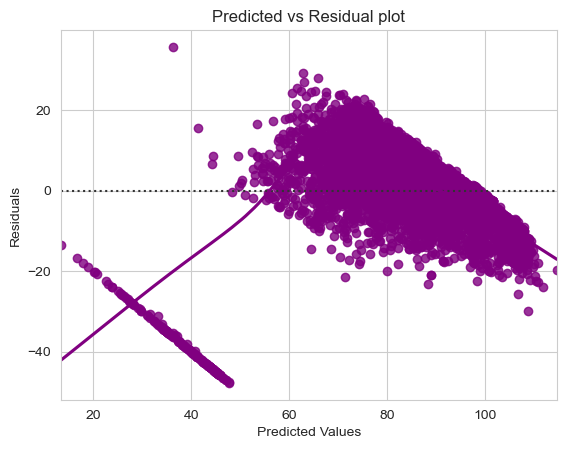

In [69]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Predicted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Predicted vs Residual plot")
plt.show()

No pattern in the data thus the assumption of linearity and independence of predictors satisfied.

### Test for Homoscedasticity

In [70]:
import statsmodels.stats.api as sms
sms.het_goldfeldquandt(df_pred["Residuals"], X_train8)

(1.1204704174421567, 0.0011977508304251002, 'increasing')

Null Hypothesis: H0- Homoscedasticity - Variance does not change.

Alternate Hypothesis: H1 - Heteroscedasticity - Variance changes.



### Insights:

Since p-value < 0.05 we can say that the residuals are heteroscedastic.
This test fails but we go ahead with the modeling.

### Durbin - Watson Test

In [71]:
import statsmodels
statsmodels.stats.stattools.durbin_watson(df_pred["Residuals"], axis=0)

2.0544956570967106

The value is approximately equal to 2 states there is no auto correlation between errors.

### Test for Normality

Skew : -1.3903162242010205


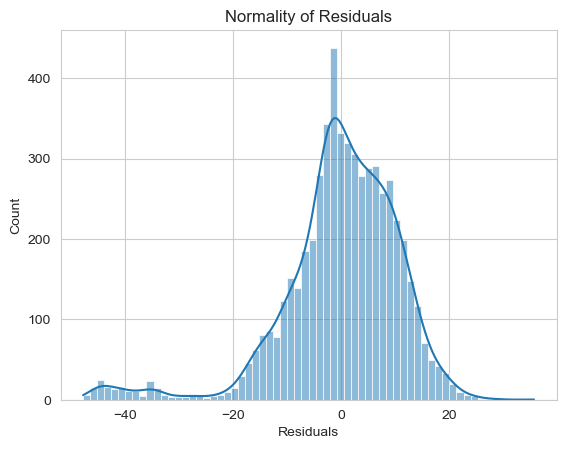

In [72]:
# Test for Normality
sns.histplot(df_pred["Residuals"], kde =True) 
print("Skew :",df_pred["Residuals"].skew()) 
plt.title("Normality of Residuals") 
plt.show()

In [73]:
#Statistical Test for Normality
#Null Hypothesis - Data is normal
#Alternate Hypothesis - Data is non-normal
import scipy.stats as stats
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9087080955505371, pvalue=0.0)

* Since p-value < 0.05, the residuals are not normal as per shapiro test.
But visually the data looks normal so we ignore the result of shapiro test

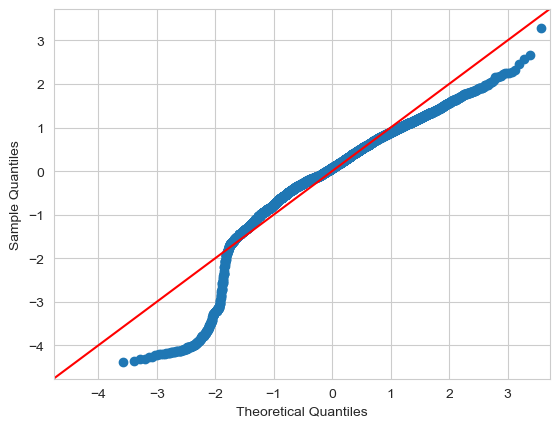

In [74]:
# Plot of the QQ Curve
import statsmodels.api as sm
fig = sm.qqplot(df_pred["Residuals"],fit=True,line='45')
plt.show()

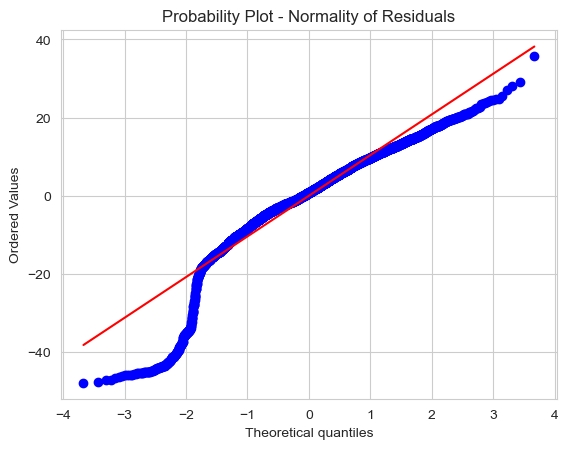

In [75]:
import pylab
import scipy.stats as stats 
stats.probplot(df_pred["Residuals"],dist ="norm", plot =pylab) 
plt.title("Probability Plot - Normality of Residuals") 
plt.show()

A normal probability plot, or more specifically a quantile-quantile (Q-Q) plot, shows the distribution of the data against the expected normal distribution. For normally distributed data, observations should lie approximately on a straight line.

If the data is normally distributed, the points will fall on the 45-degree reference line. If the data is not normally distributed, the points will deviate from the reference line.

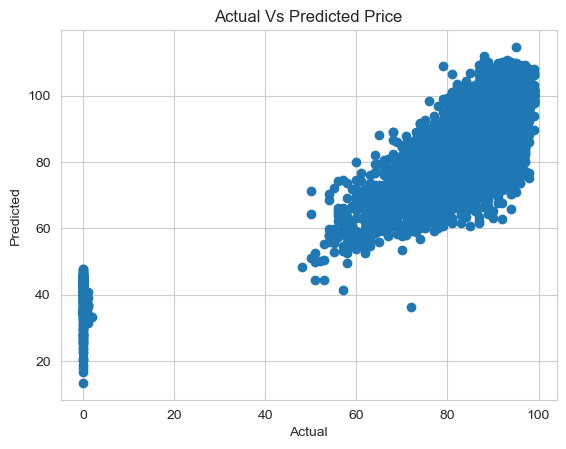

In [76]:
plt.scatter(df_pred["Actual Values"], df_pred["Predicted Values"]) 
plt.title("Actual Vs Predicted Price") 
plt.xlabel("Actual") 
plt.ylabel("Predicted") 
plt.show()

## 1.4 Business Recommendations and Actionable Insights

## 1.4.1  Comment on the Linear Regression equation from the final model and impact of relevant variables (atleast 2) as per the equation

In [77]:
olsres8.params


const                   46.340397
lread                   -0.019346
lwrite                   0.007449
scall                    0.001217
swrite                  -0.003766
exec                    -0.207445
rchar                   -0.000004
wchar                   -0.000012
pgout                   -0.129527
atch                    -0.053865
ppgin                    0.002089
pflt                    -0.040057
freemem                 -0.001606
freeswap                 0.000031
runqsz_Not_CPU_Bound     7.719418
dtype: float64

In [78]:
# Linear Regression Equation

for i,j in np.array(olsres8.params.reset_index()):
    print('({}) * {} +'.format(round(j,6),i),end=' ')

(46.340397) * const + (-0.019346) * lread + (0.007449) * lwrite + (0.001217) * scall + (-0.003766) * swrite + (-0.207445) * exec + (-4e-06) * rchar + (-1.2e-05) * wchar + (-0.129527) * pgout + (-0.053865) * atch + (0.002089) * ppgin + (-0.040057) * pflt + (-0.001606) * freemem + (3.1e-05) * freeswap + (7.719418) * runqsz_Not_CPU_Bound + 

Observations:

1 unit increase in the 'lread' leads to a 0.066 times decrease in the usr keeping all other predictors constant.
1 unit increase in the 'lwrite' leads to a 0.00066 times decrease in the usr keeping all other predictors constant
1 unit increase in the number of system calls 'scall' leads to a 0.0058 times decrease in the usr keeping all other predictors constant.
1 unit increase in the 'atch' leads to a 0.59 times increase in the usr keeping all other predictors constant.
if 'runqsz_Not_CPU_Bound' is present, it increases the usr by a factor of 1.6 keeping all other predictors constant.


## 1.4.2 Actionable Insights and Recommendations

•	The R-squared value and the adjusted R-squared value are almost the same, that is, 79.5%.
•	This tells us that the linear regression model has an accuracy of 79.5%.
•	R-squared is a summary statistic that quantifies the proportion of variation in the outcome variable explained by the explanatory variable.
•	Also, the other measures which are RMSE(Root Mean Squared Error) and MSE(Mean Squared Error) are very low. Lower these values, better the model is.
•	Two most significant features are ‘runqsz’ and ‘atch’, which have a positive correlation with the dependent variable ‘usr’. 
•	One unit increase in ‘runqsz’ leads to an increase of 1.6 times the ‘usr’ variable. One unit increase in ‘atch’ variable leads to an increase in 0.59 times of the ‘usr’ variable.
•	Two other variables which are negatively correlated to ‘usr’ variable are ‘exec’ and ‘pgout’. 
•	One unit increase in ‘exec’ leads to a decrease of 0.35 times of the ‘usr’ variable. One unit increase in ‘pgout’ leads to a decrease of 0.34 times of the ‘usr’ variable. 
•	Thus, the most significant system attributes which influence the ‘usr’ variable are the process run queue size (runqsz), number of page attaches (atch), number of system execute calls per second(exec) and number of page out requests (pgout) per second.
•	For the business to do better, the user should focus on the four significant variables and try to tune the performance of the dataset by increasing or decreasing the four variables.


********************************************************************************************************************************

# Problem - 2

In your role as a statistician at the Republic of Indonesia Ministry of Health, you have been entrusted with a dataset containing information from a Contraceptive Prevalence Survey. This dataset encompasses data from 1473 married females who were either not pregnant or were uncertain of their pregnancy status during the survey.

Your task involves predicting whether these women opt for a contraceptive method of choice. This prediction will be based on a comprehensive analysis of their demographic and socio-economic attributes.

## Data Description
1. Wife's age (numerical)
2. Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary
3. Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary
4. Number of children ever born (numerical)
5. Wife's religion (binary) Non-Scientology, Scientology
6. Wife's now working? (binary) Yes, No
7. Husband's occupation (categorical) 1, 2, 3, 4(random)
8. Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high
9. Media exposure (binary) Good, Not good
10. Contraceptive method used (class attribute) No,Yes



## 2.1 Performing Exploratory Data Analysis (EDA)

## 2.1.1 Importing Libraries

In [79]:
# Importing the necessary packages

# For Data Wrangling Data Processing
import numpy as np 
import pandas as pd

# Data Visualizaiton
import matplotlib.pyplot as plt 
import seaborn as sns

# For Modeling
from sklearn.linear_model import LogisticRegression

#For Model Performance and Tuning 
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn import metrics
from sklearn.metrics import roc_auc_score, roc_curve, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Filtering warning message
from warnings import filterwarnings 
filterwarnings ("ignore")

## 2.1.2 Reading and Loading the dataset

In [80]:
cont_df = pd.read_excel('Contraceptive_method_dataset.xlsx')

In [81]:
cont_df.head(5)

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


## 2.1.3 Checking shape

In [82]:
cont_df.shape

(1473, 10)

The dataset has 1473 rows and 10 columns.

## 2.1.4 Checking datatypes

In [83]:
cont_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


Out of 10 columns, 3 are numeric type and 7 are object type columns. The categorical columns are not in encoded format.
There are missing values in 2 columns, namely, Wife_age and No_of_children_born.

## 2.1.5 Checking the statistical summary

In [84]:
cont_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


In [85]:
cont_df.describe(include='object').T

,count,unique,top,freq
Wife_ education,1473,4,Tertiary,577
Husband_education,1473,4,Tertiary,899
Wife_religion,1473,2,Scientology,1253
Wife_Working,1473,2,No,1104
Standard_of_living_index,1473,4,Very High,684
Media_exposure,1473,2,Exposed,1364
Contraceptive_method_used,1473,2,Yes,844


### Inferences:

* The columns Wife_age and No_of_children_born have missing values as the count is less than the total number of rows in the dataset.
* The minimum age of a wife opting or not opting for contraceptive is 16 years and the maximum age is 49 years with the mean age being 32 years.
* The maximum number of children born are 16. The average number of children is 3. The median number of children born is also 3.
* Educated wives count upto a number of 577 while educated husbands count up to 899.
* Most of the wives practice Scientology religion.
* Most of the wives do not work. Out of a total of 1473, 1253 wives do not work.
* A very high standard of living is enjoyed by 684 people in Indonesia.
* 844 people have used contraceptives while the remaining have not used.
* Most of the women in Indonesia are media exposed.

## 2.1.6 Univariate Analysis

We split the dataset into two datasets - one for numerical type fields and the other with categorical columns.

### 2.1.6.1 Numerical Columns

In [86]:
df_num = cont_df.select_dtypes(include=['int64','float64'])
df_cat = cont_df.select_dtypes(['object'])

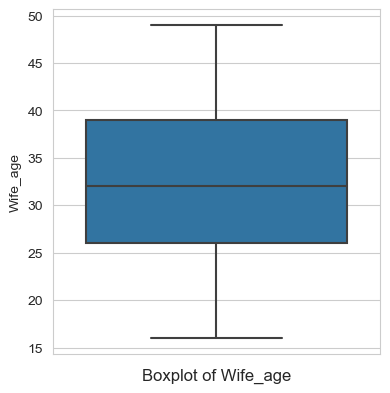

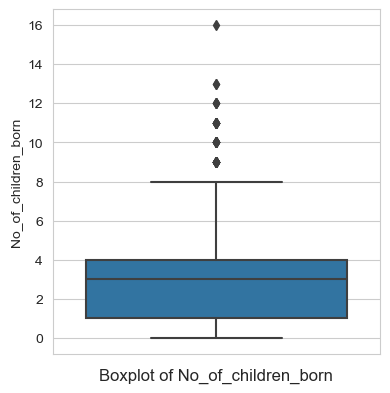

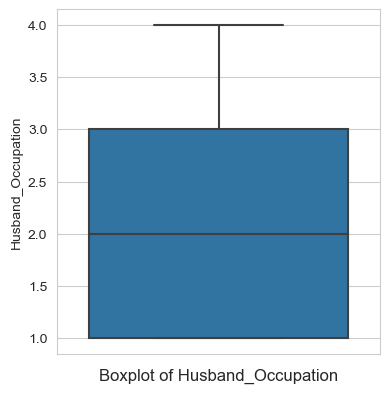

In [87]:
columns = ['Wife_age', 'No_of_children_born', 'Husband_Occupation']
# Nested loop to generate box plots for each combination
for i in columns:
    fig, axs = plt.subplots(figsize= (4, 4))
    sns.boxplot (y=df_num[i], orient= 'v') 
    plt.title("Boxplot of " + i, y=-0.1)
    plt.tight_layout()
    plt.show()

### 2.1.6.2 Categorical Columns

In [88]:
lstcatcolumns=list(df_cat.columns.values)
len(lstcatcolumns)


7

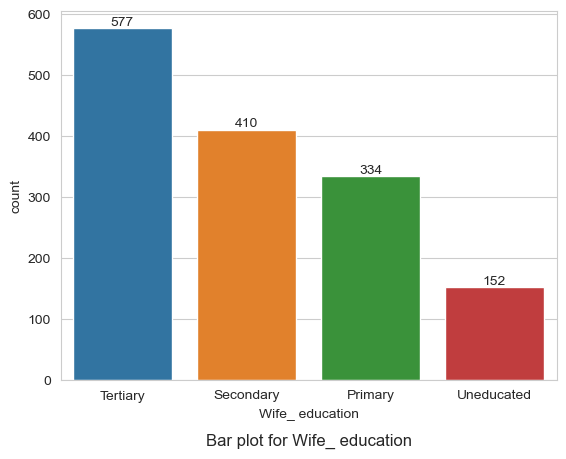

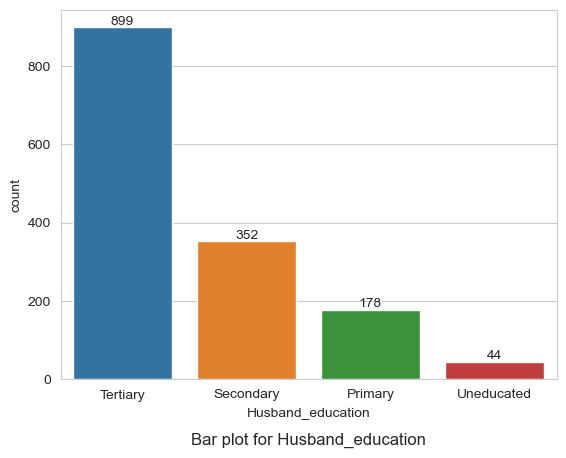

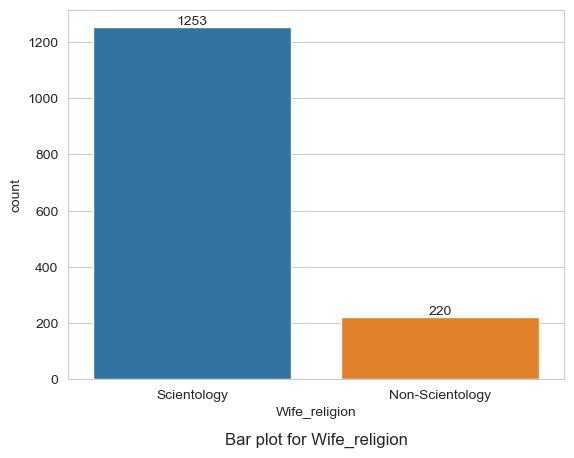

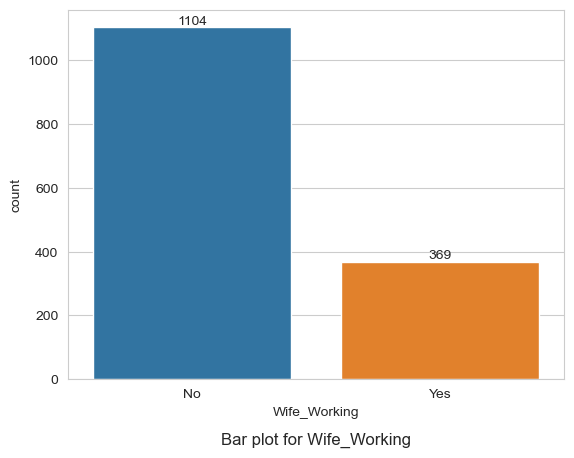

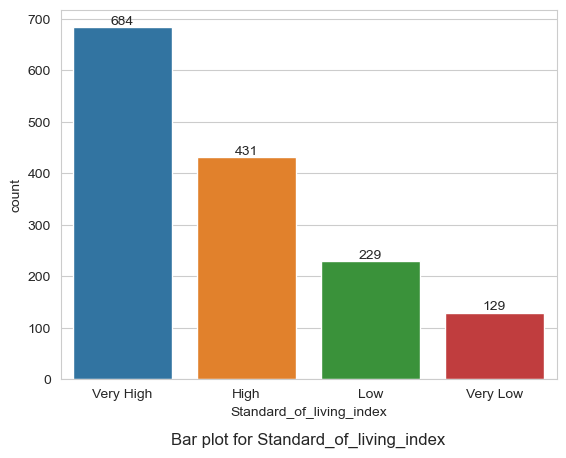

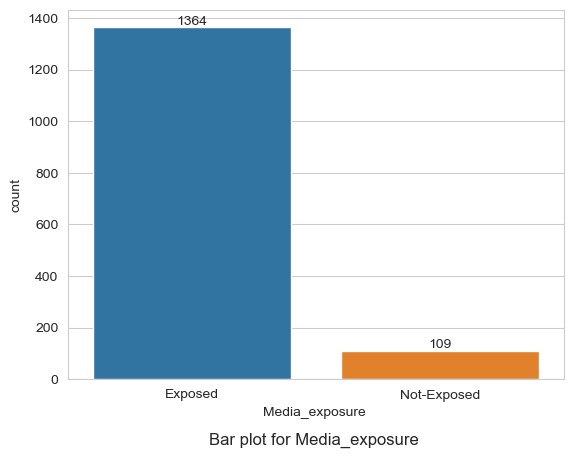

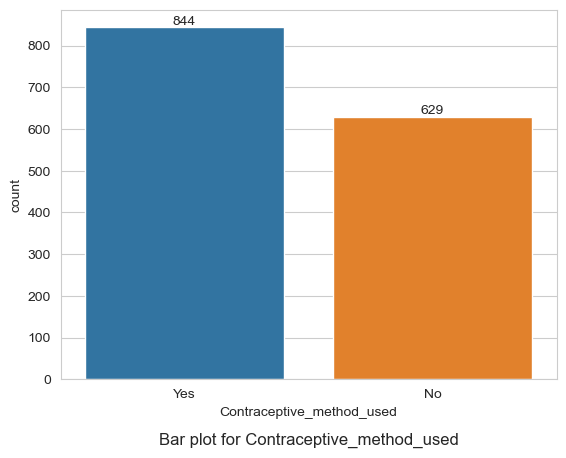

In [89]:
for i in lstcatcolumns:
    splot=sns.countplot(df_cat, x=df_cat[i],order=df_cat[i].value_counts().index);
    plt.bar_label(splot.containers[0])
    plt.title("Bar plot for " + i, y=-0.2)
    plt.show()


Insights:


## 2.1.7 Multivariate Analysis

### 2.1.7.1 Numeric vs Numeric

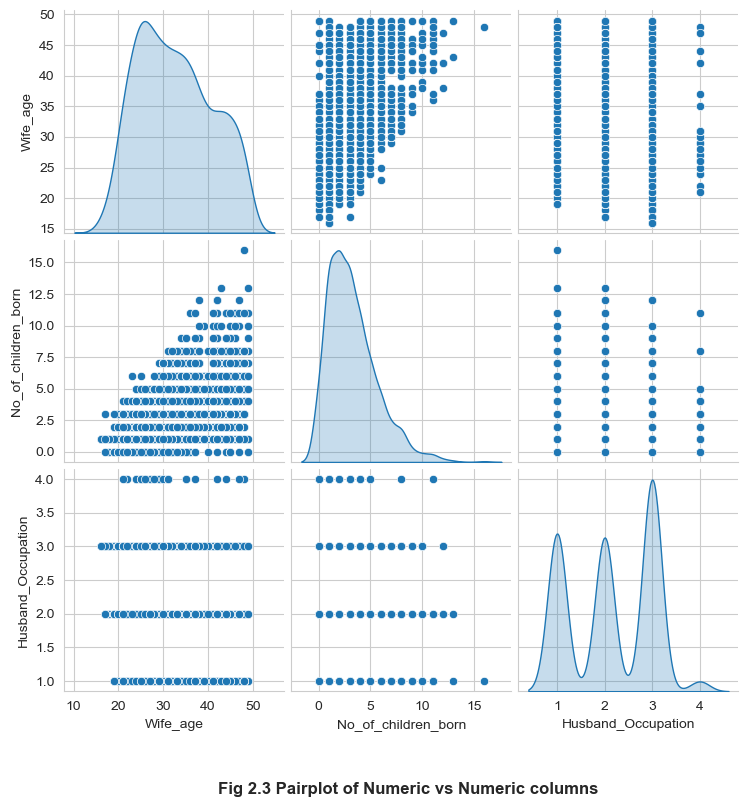

In [90]:
sns.pairplot(df_num, diag_kind="kde") # to plot density curve instead of histogram on the diag) 
plt.title("Fig 2.3 Pairplot of Numeric vs Numeric columns", x= -0.5, y= -0.5, fontweight = 'bold')
plt.show()

### 2.1.7.2 Categorical vs Numerical

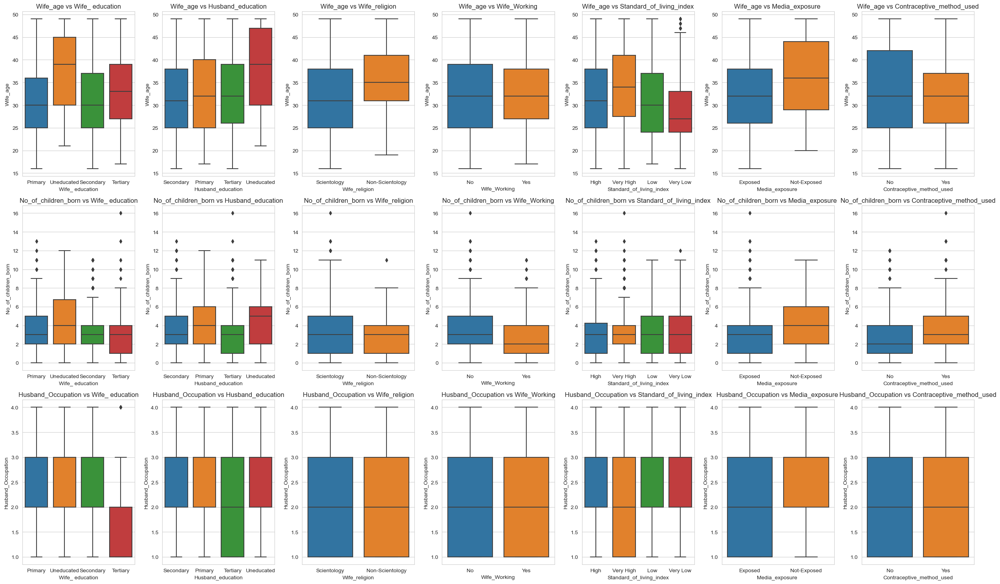

In [91]:
# Define the columns you want to create box plots for
numerical_columns = ['Wife_age','No_of_children_born','Husband_Occupation']
categorical_columns = ['Wife_ education', 'Husband_education', 'Wife_religion', 'Wife_Working', 'Standard_of_living_index', 'Media_exposure ', 'Contraceptive_method_used']

# Create subplots
fig, axes = plt.subplots(len(numerical_columns), len(categorical_columns), figsize=(25,15))

# Nested loop to generate box plots for each combination
for i, num_col in enumerate(numerical_columns):
    for j, cat_col in enumerate(categorical_columns):
        ax = axes[i, j]
        sns.boxplot(y=df_num[num_col], x=df_cat[cat_col], ax=ax)
        ax.set_title(f'{num_col} vs {cat_col}')
        ax.set_xlabel(cat_col)
        ax.set_ylabel(num_col)

        
# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

Insights:


### 2.1.7.3 Categorical vs Categorical

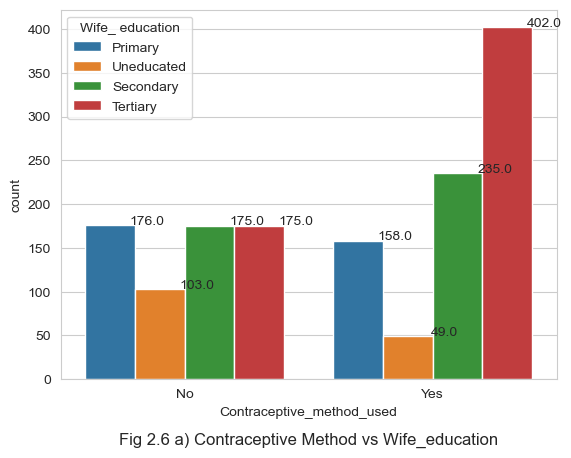

In [185]:
a=sns.countplot(x='Contraceptive_method_used', hue='Wife_ education', data=cont_df)
for p in a.patches:
    a.annotate(p.get_height(),(p.get_x()+0.25, p.get_height()+1), ha='center')
    plt.title("Fig 2.6 a) Contraceptive Method vs Wife_education", y =-0.2)
plt.show()

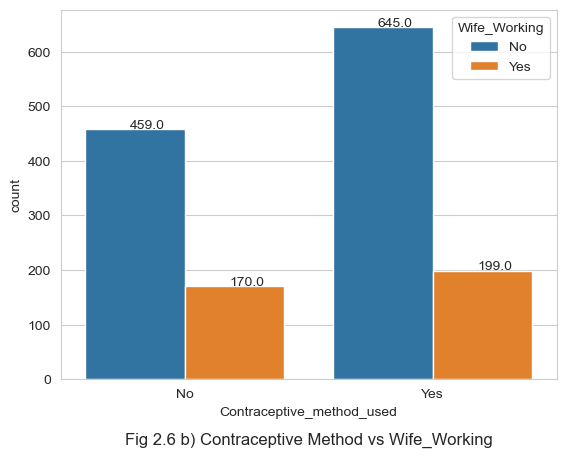

In [186]:
a=sns.countplot(x='Contraceptive_method_used', hue='Wife_Working', data=cont_df)
for p in a.patches:
    a.annotate(p.get_height(),(p.get_x()+0.25, p.get_height()+1), ha='center')
    plt.title("Fig 2.6 b) Contraceptive Method vs Wife_Working", y =-0.2)
plt.show()

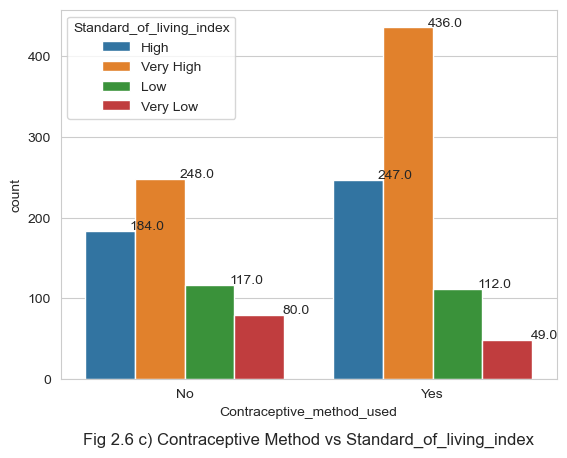

In [187]:
a=sns.countplot(x='Contraceptive_method_used', hue='Standard_of_living_index', data=cont_df)

for p in a.patches:
    a.annotate(p.get_height(),(p.get_x()+0.25, p.get_height()+1.25), ha='center')
    plt.title("Fig 2.6 c) Contraceptive Method vs Standard_of_living_index", y =-0.2)
plt.show()

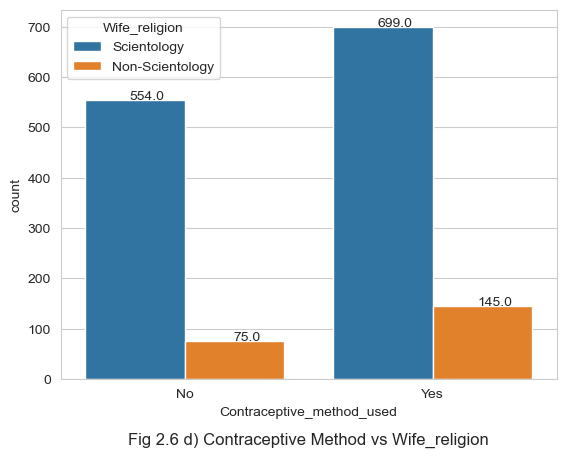

In [188]:
a=sns.countplot(x='Contraceptive_method_used', hue='Wife_religion', data=cont_df)
for p in a.patches:
    a.annotate(p.get_height(),(p.get_x()+0.25, p.get_height()+1), ha='center')
    plt.title("Fig 2.6 d) Contraceptive Method vs Wife_religion", y =-0.2)
plt.show()

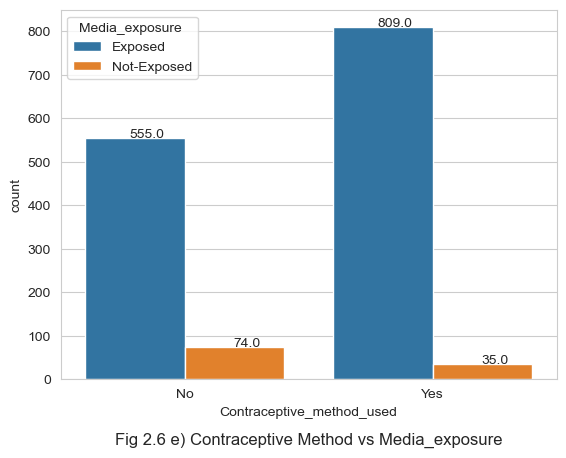

In [189]:
a=sns.countplot(x='Contraceptive_method_used', hue='Media_exposure ', data=cont_df)
for p in a.patches:
    a.annotate(p.get_height(),(p.get_x()+0.25, p.get_height()+1), ha='center')
    plt.title("Fig 2.6 e) Contraceptive Method vs Media_exposure", y =-0.2)
plt.show()

## 2.1.7.4 Correlation Plot

<Axes: >

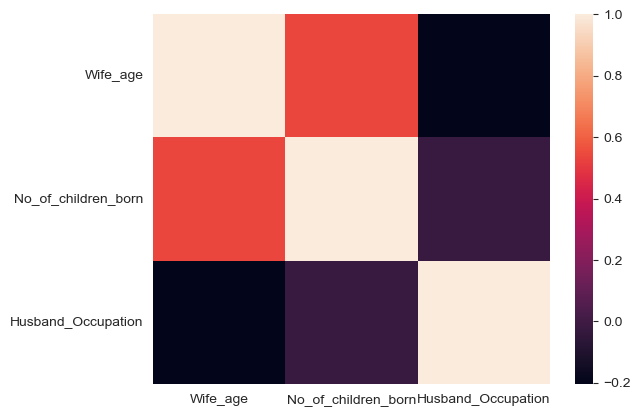

In [97]:
sns.heatmap(cont_df.corr())

## 2.1.7.5 Key meaningful observations on individual variables and the relationship between variables:


1. Number of children born has outliers.
2. The median age of women using contraceptives is 32 years.
3. The count of highly educated women is 577 while that of uneducated women is 152. The number of women uneducated is far less as compared to women having at least basic education.
4. Very few, almost negligible number of husbands are uneducated. The count is just 44. Most of the husbands are highly educated with a count of almost 899. Most of them have primary or secondary education.
5. 1253 women practice Scientology religion while only 220 are non-scientologists.
6. WOrking wives outnumber the non-working wives.
7. 129 people have very low standard of living while 684 enjoy very high standard of living. 
8. 1364 people are exposed to media as compared to 109 who have no media exposure.
9. 844 women have used contraceptives while 629 have not used any contraceptives.
10. Uneducated women fall in the median age of 40 years.
11. The median age of working women using contraceptives is slightly more than the median age of women not using contraceptives.
12. The median age of uneducated women is more for the number of children born than that of educated women.
13. Highly educated women have the maximum usage of contraceptives.
14. 436 people having very high standard of living use contraceptives. 248 people who have high standard of living but do not use conraceptives.
15. 809 people who are exposed to media use contraceptives.

# 2.2 Data Preprocessing

## 2.2.1 Missing value treatment

In [98]:
cont_df.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

We see that the columns 'Wife_age' and 'No_of_children_born' have missing values in them. One column 'Wife_age' has 71 missing values and 'No_of_children_born' has 21 missing values. 

### Missing Values Treatment

In [99]:
df = cont_df.fillna(cont_df.median())

In [100]:
df.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

## 2.2.2 Outlier treatment

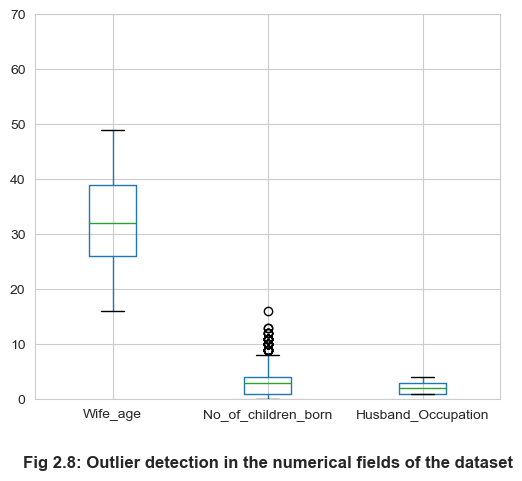

In [195]:
df_num.boxplot(figsize=(6,5))
plt.ylim(0, 70)
plt.xticks(rotation=0)
plt.title("Fig 2.8: Outlier detection in the numerical fields of the dataset", y = -0.2, fontweight = 'bold')
plt.show()

In [196]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [197]:
cont = df.dtypes[(df.dtypes!='uint8') & (df.dtypes!='object') & (df.dtypes!='bool')].index
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

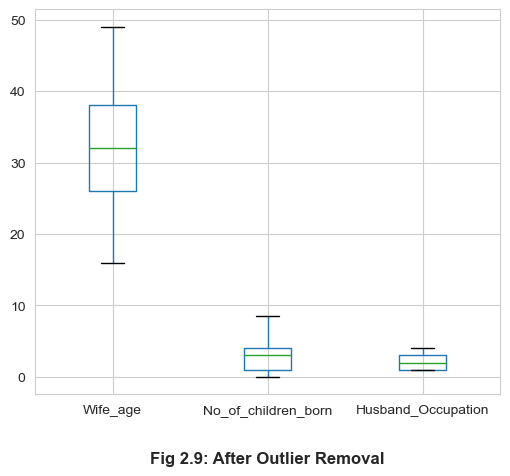

In [198]:
plt.figure(figsize=(6,5))
df[cont].boxplot()
plt.title('Fig 2.9: After Outlier Removal',fontsize=12, y = -0.2, fontweight='bold')
plt.show()

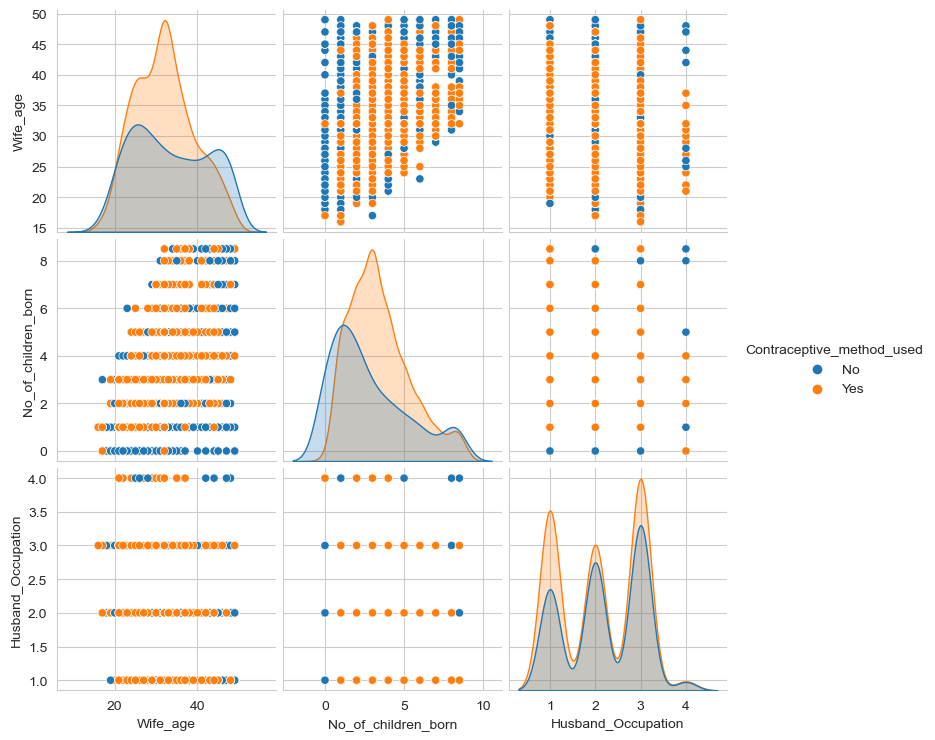

In [105]:
sns.pairplot(df,hue='Contraceptive_method_used', diag_kind='kde')

### 2.2.3 Feature Engineering

Feature engineering is a crucial step in the machine learning pipeline. It involves creating new features or modifying existing features which might enable the machine learning models to predict more accurately.

We can create new features that capture the interaction between different system attributes. For example, a feature can be created that represents the ratio of 'Wife age' to 'No of children born'. These new features might help in capturing the relationships between different system attributes more effectively. 
For this dataset, no new feature has been created.


### 2.2.4 Encoding the data

In [106]:
df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2.0,High,Exposed,No
1,45.0,Uneducated,Secondary,8.5,Scientology,No,3.0,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3.0,Very High,Exposed,No
3,42.0,Secondary,Primary,8.5,Scientology,No,3.0,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3.0,Low,Exposed,No


In [107]:
## We are coding up the 'Wife_education' variable in an ordinal manner

df['Wife_ education']=np.where(df['Wife_ education'] =='Uneducated', '1', df['Wife_ education'])
df['Wife_ education']=np.where(df['Wife_ education'] =='Primary', '2', df['Wife_ education'])
df['Wife_ education']=np.where(df['Wife_ education'] =='Secondary', '3', df['Wife_ education'])
df['Wife_ education']=np.where(df['Wife_ education'] =='Tertiary', '4', df['Wife_ education'])

In [108]:
df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,Secondary,3.0,Scientology,No,2.0,High,Exposed,No
1,45.0,1,Secondary,8.5,Scientology,No,3.0,Very High,Exposed,No
2,43.0,2,Secondary,7.0,Scientology,No,3.0,Very High,Exposed,No
3,42.0,3,Primary,8.5,Scientology,No,3.0,High,Exposed,No
4,36.0,3,Secondary,8.0,Scientology,No,3.0,Low,Exposed,No


In [109]:
## We are coding up the 'Husband_education' variable in an ordinal manner

df['Husband_education']=np.where(df['Husband_education'] =='Uneducated', '1', df['Husband_education'])
df['Husband_education']=np.where(df['Husband_education'] =='Primary', '2', df['Husband_education'])
df['Husband_education']=np.where(df['Husband_education'] =='Secondary', '3', df['Husband_education'])
df['Husband_education']=np.where(df['Husband_education'] =='Tertiary', '4', df['Husband_education'])

In [110]:
df['Wife_religion']=pd.get_dummies(df['Wife_religion'], columns=['religion'],drop_first=True)

In [111]:
df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,1,No,2.0,High,Exposed,No
1,45.0,1,3,8.5,1,No,3.0,Very High,Exposed,No
2,43.0,2,3,7.0,1,No,3.0,Very High,Exposed,No
3,42.0,3,2,8.5,1,No,3.0,High,Exposed,No
4,36.0,3,3,8.0,1,No,3.0,Low,Exposed,No


In [112]:
df['Wife_Working']=pd.get_dummies(df['Wife_Working'], columns=['Working'],drop_first=True)

In [113]:
df['Standard_of_living_index']=np.where(df['Standard_of_living_index'] =='Very Low', '1', df['Standard_of_living_index'])
df['Standard_of_living_index']=np.where(df['Standard_of_living_index'] =='Low', '2', df['Standard_of_living_index'])
df['Standard_of_living_index']=np.where(df['Standard_of_living_index'] =='High', '3', df['Standard_of_living_index'])
df['Standard_of_living_index']=np.where(df['Standard_of_living_index'] =='Very High', '4', df['Standard_of_living_index'])

In [114]:

df['Contraceptive_method_used']=pd.get_dummies(df['Contraceptive_method_used'], columns=['Contraceptive'],drop_first=True)

In [115]:
df['Media_exposure ']=pd.get_dummies(df['Media_exposure '], columns=['Exposure'],drop_first=True)

In [116]:
df.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,1,0,2.0,3,0,0
1,45.0,1,3,8.5,1,0,3.0,4,0,0
2,43.0,2,3,7.0,1,0,3.0,4,0,0
3,42.0,3,2,8.5,1,0,3.0,3,0,0
4,36.0,3,3,8.0,1,0,3.0,2,0,0


As all the columns are now in the numerical form , our data is ready for logistic regression modeling.

## 2.2.4 Train-test split

In [117]:
X=df.drop('Contraceptive_method_used',axis=1)

In [118]:
Y=df.pop('Contraceptive_method_used')

In [119]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [120]:
X_train.shape

(1031, 9)

In [121]:
y_train.shape

(1031,)

In [122]:
X_test.shape

(442, 9)

## 2.3 Build Different Models

## 2.3.1 Building the Logistic Regression Model

In [123]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

#### Accuracy of the testing dataset

In [124]:
predict = model.predict(X_test)

In [125]:
model_score_test = model.score(X_test, y_test)
print(model_score_test)

0.6877828054298643


#### Accuracy of the training dataset

In [126]:
model_score_train = model.score(X_train, y_train)
print(model_score_train)

0.6731328806983511


#### Accuracy of the Logistic Regression Model

In [127]:
# Check the accuracy

from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, predict)
print("Accuracy =", accuracy)

Accuracy = 0.6877828054298643


We have a 68.7% accuracy on the testing dataset of the Logistic Regression model and 67.3% accuracy on the training dataset.

#### Confusion Matrix Metrics

In [128]:
# Generate the confusion matrix

from sklearn.metrics import confusion_matrix
confusionmatrix = confusion_matrix(y_test, predict)
print(confusionmatrix)

[[ 96  97]
 [ 41 208]]


In [129]:
# Extracting TN, TP, FP and FN

tn, tp, fn, fp = confusion_matrix(y_test, predict).ravel()
print("Total Negatives = ", tn ,", Total Positives = " , tp,", False Negatives = ", fn, ", False Positives = ", fp)

Total Negatives =  96 , Total Positives =  97 , False Negatives =  41 , False Positives =  208


In [130]:
# Confusion Matrix metrics

matrix = classification_report(y_test, predict)
print(matrix)

              precision    recall  f1-score   support

           0       0.70      0.50      0.58       193
           1       0.68      0.84      0.75       249

    accuracy                           0.69       442
   macro avg       0.69      0.67      0.67       442
weighted avg       0.69      0.69      0.68       442



In [131]:
model.coef_

array([[-0.07719908,  0.56792995, -0.02219121,  0.36247658, -0.48462264,
        -0.01496458,  0.0793416 ,  0.22907061, -0.47882478]])

In [132]:
model.intercept_

array([-0.35620442])

In [133]:
round (pd.DataFrame(model.coef_.reshape(1,-1),columns=X_train.columns),6).T

,0
Wife_age,-0.077199
Wife_ education,0.567930
Husband_education,-0.022191
No_of_children_born,0.362477
Wife_religion,-0.484623
Wife_Working,-0.014965
Husband_Occupation,0.079342
Standard_of_living_index,0.229071
Media_exposure,-0.478825


### Insights:

• We observe that Wife_education and No_of_children_born are the two features which positively affect the dependent variable, ‘Contraceptive_method_used’. 

• 1 unit increase in Wife_education increases the contraceptive_method_used by 0.567 units. A 1 unit increase in No_of_children_used increases the contraceptive_method_used by 0.36 units.

• Also, Wife_religion and Media_exposure negatively impact the dependent variable.

• 1 unit increase in Wife_religion and Media_exposure decreases the contraceptive_method_used by almost 0.48 units.




## 2.3.2 Building the LDA model

In [211]:
# For Modeling
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Model Evaluation
from sklearn import metrics, model_selection

# Scaling the dataset
from sklearn.preprocessing import scale

In [212]:
clf = LinearDiscriminantAnalysis()
model1 = clf.fit(X_train, y_train)
model1

LinearDiscriminantAnalysis()

### Accuracy of training and testing dataset in LDA

In [218]:
accuracy_train = model1.score(X_train, y_train)
print("The accuracy of the training set is", accuracy_train)

The accuracy of the training set is 0.6547041707080504


In [219]:
accuracy_test = model1.score(X_test, y_test)
print("The accuracy of the testing set is", accuracy_test)

The accuracy of the testing set is 0.665158371040724


### Predictions

In [213]:
y_pred = model1.predict(X_test)
y_pred

array([1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0,

In [214]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      0.39      0.50       193
           1       0.65      0.88      0.75       249

    accuracy                           0.67       442
   macro avg       0.68      0.63      0.63       442
weighted avg       0.68      0.67      0.64       442



We have a 68% accuracy.

In [138]:
model1.coef_

array([[-0.075698  ,  0.57392321, -0.02674488,  0.353946  , -0.50651093,
        -0.00504648,  0.07446757,  0.23754544, -0.49804676]])

In [139]:
model1.intercept_

array([-0.34837862])

In [140]:
X_train.columns


Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure '],
      dtype='object')

In [141]:
round (pd.DataFrame(model1.coef_.reshape(1,-1),columns=X_train.columns),6).T

,0
Wife_age,-0.075698
Wife_ education,0.573923
Husband_education,-0.026745
No_of_children_born,0.353946
Wife_religion,-0.506511
Wife_Working,-0.005046
Husband_Occupation,0.074468
Standard_of_living_index,0.237545
Media_exposure,-0.498047


LDF = -0.34837862 + (-0.075698)*Wife_age + 0.573923*Wife_education + (-0.026745)*Husband_education + 0.353946 * No_of_children_born + (-0.506511) * Wife_religion + (-0.005046) * Wife_Working + 0.074468 * Husband_Occupation + 0.237545 * Standard_of_living_index + (-0.498047) * Media_exposure

The most important features are:

1. Wife_education has a positive correlation with the contraceptive method used. 1 unit increase in Wife_education leads to 0.57 units increase in contraceptive_method_used. 

2. Wife_religion has a negative correlation with the contraceptive method used. 1 unit increase in Wife_religion leads to a decrease of 0.5 units of contraceptive_method_used.

3. 1 unit increase in Media_exposure leads to a 0.49 units decrease of contraceptive method used. 

4. 1 unit increase in No_of_children born leads to an increase of 0.35 units of contraceptive method used.

5. Hence, the most important features are Wife_education, Wife_religion, Media_exposure and No_of_children_born.

## 2.3.3 Building the CART Model

In [142]:
# Importing the necessary packages

# For Data Wrangling Data Processing
import numpy as np 
import pandas as pd

# Data Visualizaiton
import matplotlib.pyplot as plt 
import seaborn as sns

# For Modeling
from sklearn.linear_model import LogisticRegression
      
#For Model Performance and Tuning 
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn import metrics
from sklearn.metrics import roc_auc_score, roc_curve, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Filtering warning message
from warnings import filterwarnings 
filterwarnings ("ignore")

from sklearn.tree import DecisionTreeClassifier

In [143]:
df_cart = pd.read_excel('Contraceptive_method_dataset.xlsx')

In [144]:
df_cart.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [145]:
df_cart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [146]:
df_cart.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [147]:
df1 = df_cart.fillna(df_cart.median())

In [148]:
df1.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

#### Converting the object datatype columns to Numerical datatype

In [149]:
for feature in df1.columns:
    if df1[feature].dtype == 'object':
        df1[feature] = pd.Categorical(df1[feature]).codes

In [150]:
df1.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,0,1,3.0,1,0,2,0,0,0
1,45.0,3,1,10.0,1,0,3,2,0,0
2,43.0,0,1,7.0,1,0,3,2,0,0
3,42.0,1,0,9.0,1,0,3,0,0,0
4,36.0,1,1,8.0,1,0,3,1,0,0


In [151]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   int8   
 2   Husband_education          1473 non-null   int8   
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   int8   
 5   Wife_Working               1473 non-null   int8   
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   int8   
 8   Media_exposure             1473 non-null   int8   
 9   Contraceptive_method_used  1473 non-null   int8   
dtypes: float64(2), int64(1), int8(7)
memory usage: 44.7 KB


#### Train-Test Split

In [152]:
X=df1.drop('Contraceptive_method_used',axis=1)
Y=df1.pop('Contraceptive_method_used')

In [153]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

#### Build the CART Model

In [154]:
dt_model = DecisionTreeClassifier(criterion = 'gini')
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

#### Visualization of the decision tree

In [155]:
from sklearn import tree

In [156]:
import os
os.getcwd()

'C:\\Users\\ramas\\Great Learning\\MONTH 5 - PREDICTIVE MODELING'

In [157]:
train_char_label = ['No', 'Yes']
Credit_Tree_File = open('C:\\Users\\ramas\\Great Learning\\MONTH 5 - PREDICTIVE MODELING\\credit_tree.dot', 'w')

In [158]:
dot_data = tree.export_graphviz(dt_model, out_file = Credit_Tree_File, feature_names = list(X_train), class_names = train_char_label)

In [159]:
Credit_Tree_File.close()

### 2.3.4 Prune the CART model by finding the best hyperparameters using GridSearch

In [160]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7, min_samples_leaf=10, min_samples_split = 30)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [161]:
Credit_Tree_regularized = open('C:\\Users\\ramas\\Great Learning\\MONTH 5 - PREDICTIVE MODELING\\credit_tree_regularized.dot', 'w')

In [162]:
dot_data = tree.export_graphviz(reg_dt_model, out_file = Credit_Tree_regularized, feature_names = list(X_train), class_names = train_char_label)

In [163]:
Credit_Tree_regularized.close()

In [164]:
reg_dt_model.feature_importances_

array([0.28185673, 0.18600166, 0.        , 0.45060712, 0.00112088,
       0.00427491, 0.01519761, 0.03432063, 0.02662046])

In [165]:
print(pd.DataFrame(reg_dt_model.feature_importances_, columns=['Imp'], index=X_train.columns))

                               Imp
Wife_age                  0.281857
Wife_ education           0.186002
Husband_education         0.000000
No_of_children_born       0.450607
Wife_religion             0.001121
Wife_Working              0.004275
Husband_Occupation        0.015198
Standard_of_living_index  0.034321
Media_exposure            0.026620


### Insights:

As we see that the feature 'Husband_education' has a weight of 0, it has never been used in the decision tree node splitting, hence this column can be safely removed.
Also, the columns Wife_religion and Wife_Working have very low weighted values, hence can be safely removed.

The columns with the most significance are No_of_children_born and Wife_age followed by Wife_education and Standard_of_living_index.


### Predictions:

In [166]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [167]:
ytrain_predict

array([1, 1, 1, ..., 1, 0, 1], dtype=int8)

In [168]:
ytest_predict

array([1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0,

In [169]:
# Extract the probabilities
ytrain_predict1 = reg_dt_model.predict_proba(X_train)
ytest_predict1 = reg_dt_model.predict_proba(X_test)

### Model Performance

In [202]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report, confusion_matrix

In [203]:
probs_train = ytrain_predict1[:,1]

In [204]:
auc_train = roc_auc_score(y_train, probs_train)
auc_train

0.8052598103461568

In [205]:
probs_test = ytest_predict1[:,1]

In [206]:
auc_test = roc_auc_score(y_test, probs_test)
auc_test

0.7554882743408868

In [207]:
# ROC curve for training data
fpr, tpr, thresholds = roc_curve(y_train, probs_train)
print("fpr: ", fpr , "\ntpr: ", tpr, "\nthresholds: ", thresholds)

fpr:  [0.         0.00229358 0.02293578 0.10091743 0.10550459 0.1146789
 0.12155963 0.15137615 0.23394495 0.24770642 0.26376147 0.27981651
 0.29816514 0.30733945 0.39908257 0.43119266 0.44954128 0.4793578
 0.50688073 0.53899083 0.57568807 0.62614679 0.64220183 0.66743119
 0.71330275 0.75458716 0.8233945  0.8440367  1.        ] 
tpr:  [0.         0.02521008 0.1210084  0.43193277 0.4487395  0.46722689
 0.48067227 0.53781513 0.67394958 0.69579832 0.71764706 0.73781513
 0.75966387 0.7697479  0.85042017 0.87731092 0.8907563  0.90588235
 0.91932773 0.93445378 0.9512605  0.9697479  0.97478992 0.97983193
 0.98655462 0.99159664 0.99831933 1.         1.        ] 
thresholds:  [1.9375     0.9375     0.86363636 0.84474886 0.83333333 0.73333333
 0.72727273 0.72340426 0.69230769 0.68421053 0.65       0.63157895
 0.61904762 0.6        0.54545455 0.53333333 0.5        0.40909091
 0.4        0.39130435 0.38461538 0.33333333 0.3        0.21428571
 0.16666667 0.14285714 0.11764706 0.1        0.        ]


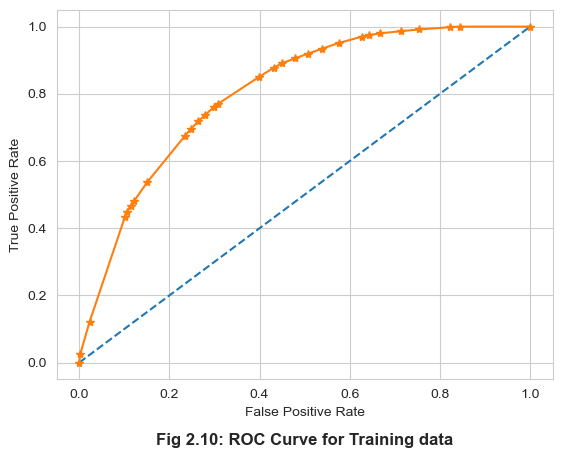

In [208]:
plt.plot([0,1],[0,1],linestyle='--')
plt.plot(fpr,tpr, marker ='*')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Fig 2.10: ROC Curve for Training data", y = -0.2, fontweight='bold')
plt.show()

In [209]:
# ROC curve for test data
fpr, tpr, thresholds = roc_curve(y_test, probs_test)

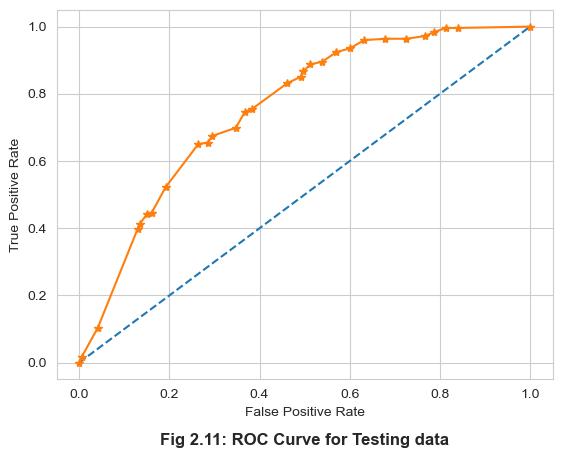

In [210]:
plt.plot([0,1],[0,1],linestyle='--')
plt.plot(fpr,tpr, marker ='*')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Fig 2.11: ROC Curve for Testing data", y = -0.2, fontweight = 'bold')
plt.show()

Insights:

We see that the AUC is slightly better for the training data as compared to the testing data.
The AUC score is 0.80 for training data while it is 0.75 for testing data. Hence, training data is better than the testing data.

In [179]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.77      0.57      0.66       436
           1       0.74      0.88      0.80       595

    accuracy                           0.75      1031
   macro avg       0.75      0.72      0.73      1031
weighted avg       0.75      0.75      0.74      1031



In [180]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.73      0.51      0.60       193
           1       0.69      0.85      0.76       249

    accuracy                           0.70       442
   macro avg       0.71      0.68      0.68       442
weighted avg       0.71      0.70      0.69       442



In [181]:
# Accuracy of training data
reg_dt_model.score(X_train, y_train)
print("The accuracy of the training data is ", reg_dt_model.score(X_train, y_train))

The accuracy of the training data is  0.7468477206595538


In [182]:
# Accuracy of test sample
reg_dt_model.score(X_test, y_test)
print("The accuracy of the testing data is ", reg_dt_model.score(X_test, y_test))

The accuracy of the testing data is  0.7013574660633484


In [183]:
confusion_matrix(y_train, ytrain_predict)

array([[248, 188],
       [ 73, 522]], dtype=int64)

In [184]:
confusion_matrix(y_test, ytest_predict)

array([[ 98,  95],
       [ 37, 212]], dtype=int64)

## 2.3.5 Check the performance of the models across train and test set using   different metrics.


As already calculated, the accuracy of the three models, namely, logistic             
Regression, LDA and CART models is shown below:

Model	Accuracy on Training Dataset	Accuracy on Testing Dataset	Overall Accuracy
Logistic Regression	67.3%	68.7%	68%
LDA	65.47%	66.51%	68%
CART	74.68%	70.13%	70%


## 2.3.6 Compare the performance of all the models built and choose the best one with proper rationale.

We see from the above table that the accuracy of the training and testing dataset for all the three models is almost the same, so no issues of overfitting or underfitting.
The accuracy of the training dataset is the highest for CART model, followed by Logistic Regression and then LDA model.
The accuracy of the testing dataset is the highest for CART model, followed by Logistic Regression and then LDA model.
The overall accuracy of the CART model is the highest at 70%.
Hence, we choose the CART model over the other models to get the most significant features which will help us in the business.


## 2.4 Business Insights and Recommendations


### 2.4.1 Comment on the importance of features based on the best model.


Best Model is the CART model.
We observe that Number of children born is the most important feature for the use of contraceptives followed by Wife age and Wife education. Both these features are the most important features in the list of features which determine the contraceptive method used.
1 unit increase in Number of children born leads to an increase of 0.45 units of contraceptive method used.
1 unit increase in Wife age leads to an increase of 0.28 units of contraceptive method used.
1 unit increase in Wife education leads to an increase of 0.186 units of contraceptive method used.


### 2.4.2 Conclude with the key takeaways (actionable insights and recommendations) for the business

We conclude that CART is the best model to classify the features of the given dataset.
Number of children born is the most important feature which determines the dependent variable, which is contraceptive method used. This is followed by Wife age and Wife education.

After a requisite number of children are born, maybe the wives use contraceptives. From a business perspective, wives with median age of 32 and above can be targeted for the sale of contraceptives.

Also, wife’s age is an important determinant of contraceptive method used. Maybe wives after a particular age group of 35 and above do not prefer to have children due to medical reasons. Hence, women of 35 age group and above is a good target group for the sale of contraceptives.

Wife education plays a significant role in determining the use of contraceptives. It is seen that women who are educated tend to use contraceptives after a certain age group in order to not have children, as compared to women who are not very educated. Hence, this group of women can be a target group for the sale of contraceptives.

Thus, as a business initiative, we can immediately spring into action with the three target groups to increase our sale of contraceptives. 
